In [ ]:
! pip install pyLDAvis

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.7 MB 3.6 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
  Created wheel for pyLDAvis: filename=pyLDAvis-3.3.1-py2.py3-none-any.whl size=136898 sha256=3f76844205850491748c889dcb9be45f90160791f55f521588c7ec7ca3f67c7e
  Stored in directory: /root/.cache/pip/wheels/c9/21/f6/17bcf2667e8a68532ba2fbf6d5c72fdf4c7f7d9abfa4852d2f
Successfully built pyLDAvis


In [ ]:
import pyLDAvis.gensim_models as gensimvis

/usr/local/lib/python3.7/dist-packages/past/types/oldstr.py:5: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working
  from collections import Iterable
/usr/local/lib/python3.7/dist-packages/past/builtins/misc.py:4: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working
  from collections import Mapping
/usr/local/lib/python3.7/dist-packages/scipy/fft/__init__.py:97: DeprecationWarning: The module numpy.dual is deprecated.  Instead of using dual, use the functions directly from numpy or scipy.
  from numpy.dual import register_func
/usr/local/lib/python3.7/dist-packages/scipy/sparse/sputils.py:17: DeprecationWarning: `np.typeDict` is a deprecated alias for `np.sctypeDict`.
  supported_dtypes = [np.typeDict[x] for x in supported_dtypes]
/usr/local/lib/python3.7/dist-packa

In [ ]:
import nltk
import pandas as pd
from sklearn.decomposition import PCA

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from nltk.probability import FreqDist
import re
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from wordcloud import WordCloud, STOPWORDS
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from gensim.models.coherencemodel import CoherenceModel
from gensim.corpora.dictionary import Dictionary
import scipy.cluster.hierarchy as sch
from scipy import stats
from sklearn.cluster import AgglomerativeClustering
from sklearn.mixture import GaussianMixture
import pyLDAvis
import gensim.corpora as corpora
from gensim.models.ldamodel import LdaModel
from sklearn.manifold import TSNE
%matplotlib inline

/usr/local/lib/python3.7/dist-packages/past/types/oldstr.py:5: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working
  from collections import Iterable


In [ ]:

overall = { 
"kmeans_pow" : {
    'Kappa_Score' : None,
    'silhouette_score' : None,
    'coherence_score' : None
    },
"AgglomerativeClustering_pow" : {
    'Kappa_Score' : None,
    'silhouette_score' : None,
    'coherence_score' : None
    },
"GaussianMixture_pow" : {
    'Kappa_Score' : None,
    'silhouette_score' : None,
    'coherence_score' : None
    },
"kmeans_pow_2000" : {
    'Kappa_Score' : None,
    'silhouette_score' :  None,
    'coherence_score' : None
    },
"AgglomerativeClustering_pow_2000" : {
    'Kappa_Score' :None,
    'silhouette_score' : None,
    'coherence_score' : None
    },
"GaussianMixture_pow_2000" : {
    'Kappa_Score' : None,
    'silhouette_score' :None,
    'coherence_score' : None
    },
"kmeans_tf" : {
    'Kappa_Score' : None,
    'silhouette_score' : None,
    'coherence_score' : None
    },
"AgglomerativeClustering_tf" : {
    'Kappa_Score' : None,
    'silhouette_score' : None,
    'coherence_score' : None
    },
"GaussianMixture_tf" : {
    'Kappa_Score' : None,
    'silhouette_score' :None,
    'coherence_score' : None
    },
"kmeans_tf_bi" : {
    'Kappa_Score' : None,
    'silhouette_score' :  None,
    'coherence_score' : None
    },
"AgglomerativeClustering_tf_bi" : {
    'Kappa_Score' : None,
    'silhouette_score' :None,
    'coherence_score' : None
    },
"GaussianMixture_tf_bi" : {
    'Kappa_Score' : None,
    'silhouette_score' :None,
    'coherence_score' : None
    }
}

In [ ]:
nltk.download('gutenberg')

[nltk_data] Downloading package gutenberg to /root/nltk_data...
[nltk_data]   Package gutenberg is already up-to-date!


True

In [ ]:
nltk.corpus.gutenberg.fileids()

['austen-emma.txt',
 'austen-persuasion.txt',
 'austen-sense.txt',
 'bible-kjv.txt',
 'blake-poems.txt',
 'bryant-stories.txt',
 'burgess-busterbrown.txt',
 'carroll-alice.txt',
 'chesterton-ball.txt',
 'chesterton-brown.txt',
 'chesterton-thursday.txt',
 'edgeworth-parents.txt',
 'melville-moby_dick.txt',
 'milton-paradise.txt',
 'shakespeare-caesar.txt',
 'shakespeare-hamlet.txt',
 'shakespeare-macbeth.txt',
 'whitman-leaves.txt']

#scrabing text book 

In [ ]:
book_1 = ' '.join(nltk.corpus.gutenberg.words('austen-emma.txt'))
book_2 = ' '.join(nltk.corpus.gutenberg.words('bible-kjv.txt'))
book_3 = ' '.join(nltk.corpus.gutenberg.words('carroll-alice.txt'))
book_4 = ' '.join(nltk.corpus.gutenberg.words('edgeworth-parents.txt'))
book_5 = ' '.join(nltk.corpus.gutenberg.words('whitman-leaves.txt'))

In [ ]:
df = pd.DataFrame({'Text':[book_1,book_2,book_3,book_4,book_5],
                   'label':['austen-emma','bible-kjv','carroll-alice','edgeworth-parents','whitman-leaves']})

#Text pre-processing  


In [ ]:
import re
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
nltk.download('stopwords')
def clean_books(df):
  stemer=PorterStemmer()
  corpus = []
  for i in range(0,len(df)):
    # replace any character with space and leave the from (a - z )
    text = re.sub('[^A-Za-z]',' ',df['Text'][i])
    text = text.lower()
    text = text.split()
    text = [stemer.stem(word) for word in text if word not in set(stopwords.words('english'))]
    text = ' '.join(text)
    corpus.append(text)
  return corpus

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:

corpus = clean_books(df)

In [ ]:
def samples(book):
  l=[]
  count = 0

  while count <200:
    sample = np.random.choice(book,150)
    l.append(sample)
    count+= 1
  return l 

In [ ]:
#['austen-emma','burgess-busterbrown','carroll-alice','edgeworth-parents','bryant-stories']
df_final = pd.concat([pd.DataFrame({'Text_sample_':samples(str(corpus[0]).split()),'label':['austen-emma']*200}),
                      pd.DataFrame({'Text_sample_':samples(str(corpus[1]).split()),'label':['bible-kjv']*200}),
                      pd.DataFrame({'Text_sample_':samples(str(corpus[2]).split()),'label':['carroll-alice']*200}),
                      pd.DataFrame({'Text_sample_':samples(str(corpus[3]).split()),'label':['edgeworth-parents']*200}),
                      pd.DataFrame({'Text_sample_':samples(str(corpus[4]).split()),'label':['whitman-leaves']*200})],axis=0) 

In [ ]:
df_final.head()

,Text_sample_,label
0,"[mr, cannot, none, sin, boot, regret, said, ba...",austen-emma
1,"[want, matter, use, moment, door, dixon, littl...",austen-emma
2,"[time, manner, assur, shew, stupid, much, give...",austen-emma
3,"[mr, would, delicaci, mistaken, belong, first,...",austen-emma
4,"[written, hear, therefor, recur, well, elton, ...",austen-emma


In [ ]:
df_final=df_final.reset_index(drop=True)

In [ ]:
df_final['Text_sample'] = df_final['Text_sample_'].apply(lambda x : ' '.join(x))

In [ ]:
df_final.head()

In [ ]:
df_final.info()

In [ ]:
df_final.to_csv('data.csv')

In [ ]:
emma = df_final['Text_sample'][df_final['label']=='austen-emma']

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


<FreqDist with 129 samples and 150 outcomes>
[('harriet', 3), ('els', 2)]


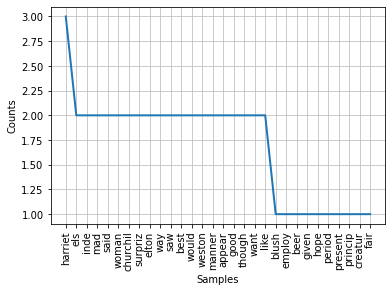

In [ ]:
nltk.download('punkt')

fdist = FreqDist(nltk.word_tokenize(df_final['Text_sample'][df_final['label']=='austen-emma'][10]))
print(fdist)
print(fdist.most_common(2))

fdist.plot(30,cumulative=False)
plt.show()

<FreqDist with 120 samples and 150 outcomes>
[('shall', 6), ('hand', 4)]


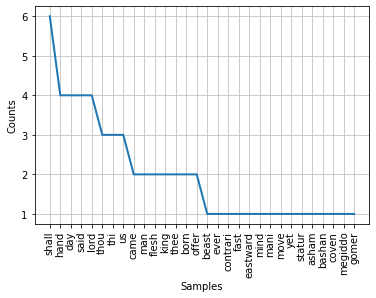

In [ ]:
fdist = FreqDist(nltk.word_tokenize(df_final['Text_sample'][df_final['label']=='bible-kjv'][250]))
print(fdist)
print(fdist.most_common(2))

fdist.plot(30,cumulative=False)
plt.show()

In [ ]:
def worldcloud(df):
  comment_words = ''
  stopwords = set(STOPWORDS)
  
  # iterate through the csv file
  for val in df:
      
      # typecaste each val to string
      val = str(val)
  
      # split the value
      tokens = val.split()
      
      # Converts each token into lowercase
      for i in range(len(tokens)):
          tokens[i] = tokens[i].lower()
      
      comment_words += " ".join(tokens)+" "
  
  wordcloud = WordCloud(width = 800, height = 800,
                  background_color ='white',
                  stopwords = stopwords,
                  min_font_size = 10).generate(comment_words)
  
  # plot the WordCloud image                      
  plt.figure(figsize = (8, 8), facecolor = None)
  plt.imshow(wordcloud)
  plt.axis("off")
  plt.tight_layout(pad = 0)
  
  plt.show()

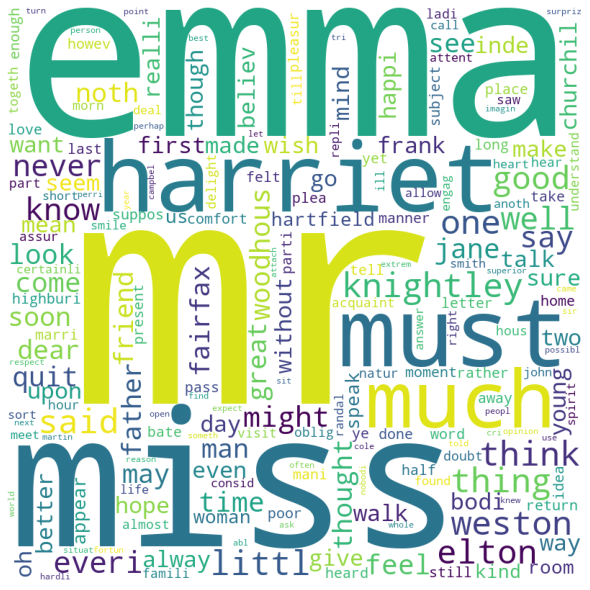

In [ ]:
worldcloud(emma)

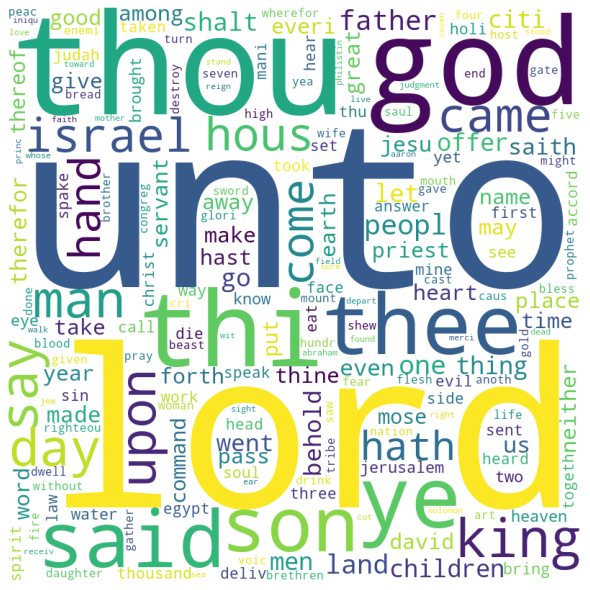

In [ ]:
# 'austen-emma','burgess-busterbrown','carroll-alice','edgeworth-parents','bryant-stories'
bible_kjv = df_final['Text_sample'][df_final['label']=='bible-kjv']
worldcloud(bible_kjv)

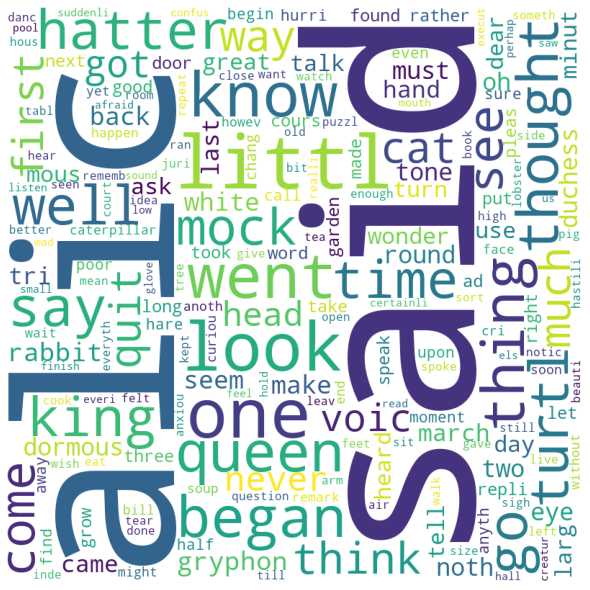

In [ ]:
carroll_alice = df_final['Text_sample'][df_final['label']=='carroll-alice']
worldcloud(carroll_alice)

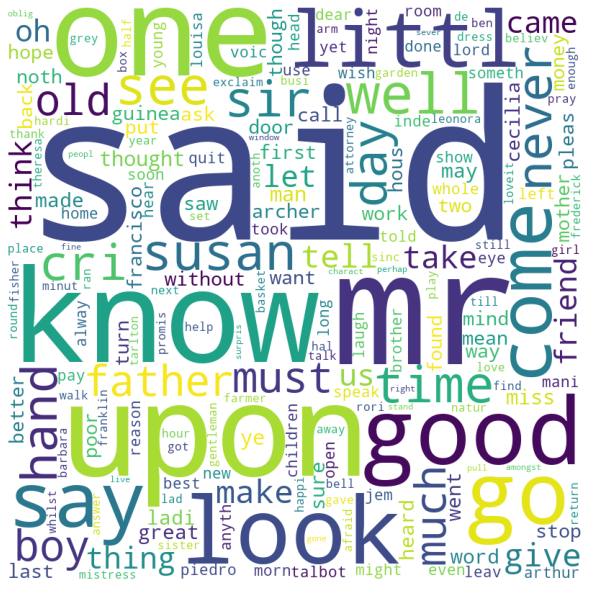

In [ ]:
edgeworth_parents = df_final['Text_sample'][df_final['label']=='edgeworth-parents']
worldcloud(edgeworth_parents)

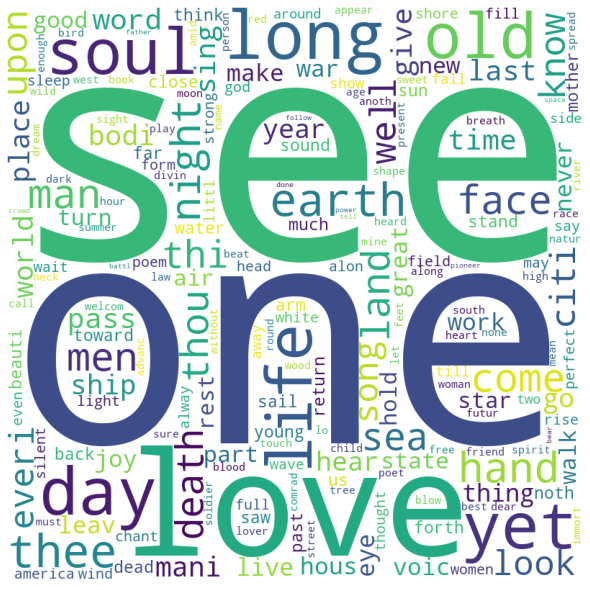

In [ ]:
whitman_leaves = df_final['Text_sample'][df_final['label']=='whitman-leaves']
worldcloud(whitman_leaves)

In [ ]:
encode = {'austen-emma' : 1 , 'bible-kjv' : 2, 'carroll-alice': 3, 'edgeworth-parents' : 4, 'whitman-leaves' :5}
df_final['label'] = df_final['label'].map(encode)

In [ ]:
X = df_final['Text_sample'].values
y = df_final['label']

In [ ]:
y.value_counts()

1    200
2    200
3    200
4    200
5    200
Name: label, dtype: int64

#bow

In [ ]:
bow = CountVectorizer()
X_bow = bow.fit_transform(X).toarray()

In [ ]:
pd.DataFrame(X_bow,columns=bow.get_feature_names())

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,aaron,aaronit,abandon,abarim,abas,abash,abat,abbey,abbot,abda,...,zin,zion,zoar,zobah,zobebah,zone,zophah,zophim,zuph,zur
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
996,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
997,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
998,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


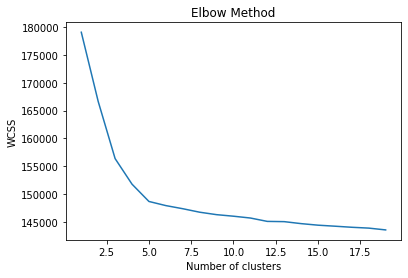

In [ ]:
wcss = []
for i in range(1, 20):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=0)
    kmeans.fit(X_bow)
    wcss.append(kmeans.inertia_)
plt.plot(range(1, 20), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

#K-means with pow

In [ ]:
kmeans = KMeans(n_clusters=5, init='k-means++',random_state=0)
pred_y = kmeans.fit_predict(X_bow)

##K-means with pow Clusters Visualization

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.008s...
[t-SNE] Computed neighbors for 1000 samples in 0.389s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 2.611634
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.102859
[t-SNE] KL divergence after 1000 iterations: 1.304622


[Text(0.5, 1.0, 'Kmean T-SNE projection')]

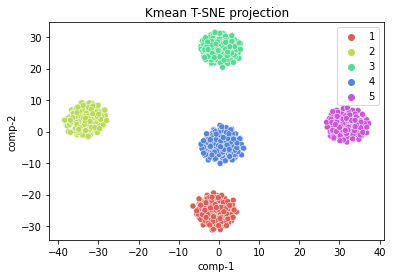

In [ ]:
# Clusters Visualization
tsne = TSNE(n_components=2, verbose=1, random_state=42)
z = tsne.fit_transform(X_bow)

tsne_df = pd.DataFrame()
tsne_df["y"] = y
tsne_df["comp-1"] = z[:,0]
tsne_df["comp-2"] = z[:,1]

sns.scatterplot(x="comp-1", y="comp-2", hue=tsne_df.y.tolist(),
                palette=sns.color_palette("hls", 5),
                data=tsne_df).set(title="Kmean T-SNE projection") 

In [ ]:
pred_y_s = pd.Series(pred_y)

In [ ]:
pred_y_s

0      3
1      3
2      3
3      3
4      3
      ..
995    4
996    4
997    4
998    4
999    4
Length: 1000, dtype: int32

In [ ]:
pred_y_s.value_counts()

3    200
2    200
1    200
0    200
4    200
dtype: int64

In [ ]:
kmean_results = pd.DataFrame(pred_y_s, columns=['Cluster'])

kmean_results

,Cluster
0,3
1,3
2,3
3,3
4,3
...,...
995,4
996,4
997,4
998,4


In [ ]:
compined_data = pd.concat([kmean_results, df_final],axis = 1)

compined_data

,Cluster,Text_sample_,label,Text_sample
0,3,"[happen, shock, discreetli, jane, unworthi, se...",1,happen shock discreetli jane unworthi send son...
1,3,"[nice, societi, could, question, bye, determin...",1,nice societi could question bye determin wheth...
2,3,"[flirtat, temper, without, someth, side, last,...",1,flirtat temper without someth side last nobodi...
3,3,"[servic, prevent, forgot, give, utter, name, m...",1,servic prevent forgot give utter name mr talk ...
4,3,"[health, repeat, isabella, hesit, sigh, snow, ...",1,health repeat isabella hesit sigh snow held wo...
...,...,...,...,...
995,4,"[year, pathway, pain, dear, rick, pass, futur,...",5,year pathway pain dear rick pass futur larg ge...
996,4,"[forc, shot, build, veda, sail, well, day, sha...",5,forc shot build veda sail well day shark word ...
997,4,"[like, soldier, much, continu, see, shallow, d...",5,like soldier much continu see shallow dropt re...
998,4,"[thunder, spirit, good, command, passion, mani...",5,thunder spirit good command passion mani festi...


In [ ]:
zero_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 0]['label']))[0][0]
one_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 1]['label']))[0][0]
two_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 2]['label']))[0][0]
three_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 3]['label']))[0][0]
four_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 4]['label']))[0][0]

/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:498: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  counts = np.zeros(a_view.shape[:-1], dtype=np.int)
/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:498: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the r

In [ ]:
compined_data['cluster_name'] = compined_data['Cluster'].map({0:zero_map_val, 
                                                              1:one_map_val,
                                                              2:two_map_val,
                                                              3:three_map_val, 
                                                              4:four_map_val})

##K-means with pow Kappa Score

In [ ]:
from sklearn.metrics import cohen_kappa_score
kappa_score = cohen_kappa_score(compined_data['cluster_name'],compined_data['label'])
kappa_score

1.0

#K-means with pow error analysis Draw word cloud for mistakes word 

In [ ]:
if kappa_score != 1:
  error_prediction=compined_data[compined_data['cluster_name']!= compined_data['label']]

  error_text = error_prediction['Text_sample']
  worldcloud(error_text)
else:
  print('We can not plot word cloud for wordes here becuse no error her, Kappa score = 1.0')  

We can not plot word cloud for wordes here becuse no error her, Kappa score = 1.0


# K-means with pow silhouette score

In [ ]:
silhouette_score=silhouette_score(X_bow,pred_y)
print(silhouette_score)


0.06269148943904608


In [ ]:
tokenizer = lambda s: re.findall( '\w+', s.lower() )
texts = [ tokenizer(t) for t in  X ]

# Creating some random topics
topics = [['day','time','see','mother'],
          ['good','come','make','say'],
          ['miss','mr','emma']
           ]

# Creating a dictionary with the vocabulary
word2id = Dictionary( texts )

# Coherence model
cm = CoherenceModel(model =kmeans, topics=topics, 
                    texts=texts,
                    coherence='c_v',  
                    dictionary=word2id)

coherence = cm.get_coherence()  # get coherence value
print(coherence)

<input>:1: DeprecationWarning: invalid escape sequence \w
<input>:1: DeprecationWarning: invalid escape sequence \w
<input>:1: DeprecationWarning: invalid escape sequence \w
<input>:1: DeprecationWarning: invalid escape sequence \w
<input>:1: DeprecationWarning: invalid escape sequence \w
<input>:1: DeprecationWarning: invalid escape sequence \w
<input>:1: DeprecationWarning: invalid escape sequence \w
<input>:1: DeprecationWarning: invalid escape sequence \w
<input>:1: DeprecationWarning: invalid escape sequence \w
<input>:1: DeprecationWarning: invalid escape sequence \w
<input>:1: DeprecationWarning: invalid escape sequence \w
<input>:1: DeprecationWarning: invalid escape sequence \w
<input>:1: DeprecationWarning: invalid escape sequence \w
<input>:1: DeprecationWarning: invalid escape sequence \w
<ipython-input-45-c6f5ef41e4ff>:1: DeprecationWarning: invalid escape sequence \w
  tokenizer = lambda s: re.findall( '\w+', s.lower() )


0.620658216925428


In [ ]:
cm = CoherenceModel(model =kmeans, topics=topics, 
                    texts=texts,
                    coherence='c_v',  
                    dictionary=word2id)

coherence = cm.get_coherence()  # get coherence value
print(coherence)

0.620658216925428


In [ ]:
overall['kmeans_pow']['Kappa_Score']=kappa_score
overall['kmeans_pow']['silhouette_score']=silhouette_score
overall['kmeans_pow']['coherence_score']=coherence

overall['kmeans_pow']


{'Kappa_Score': 1.0,
 'coherence_score': 0.620658216925428,
 'silhouette_score': 0.06269148943904608}

{'color_list': ['g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',

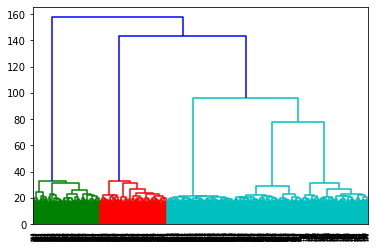

In [ ]:
dendrogram = sch.dendrogram(sch.linkage(X_bow, method='ward'))
dendrogram

# *AgglomerativeClustering with pow*

In [ ]:
hc = AgglomerativeClustering(n_clusters=5, affinity = 'euclidean', linkage = 'ward')
y_hc = hc.fit_predict(X_bow)

In [ ]:
y_hc

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 4, 1, 1, 1, 1, 1, 4, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 4, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

## AgglomerativeClustering with pow Clusters Visualization

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.008s...
[t-SNE] Computed neighbors for 1000 samples in 0.394s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 2.611634
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.102859
[t-SNE] KL divergence after 1000 iterations: 1.304622


[Text(0.5, 1.0, 'Agglomerative T-SNE projection')]

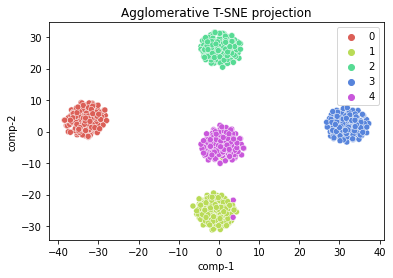

In [ ]:
# Clusters Visualization
tsne = TSNE(n_components=2, verbose=1, random_state=42)
z = tsne.fit_transform(X_bow)

tsne_df = pd.DataFrame()
tsne_df["y"] = y_hc
tsne_df["comp-1"] = z[:,0]
tsne_df["comp-2"] = z[:,1]

sns.scatterplot(x="comp-1", y="comp-2", hue=tsne_df.y.tolist(),
                palette=sns.color_palette("hls", 5),
                data=tsne_df).set(title="Agglomerative T-SNE projection") 

In [ ]:
agglomerative_clustering_result = pd.DataFrame(y_hc, columns=['Cluster_agglomerative'])

agglomerative_clustering_result

,Cluster_agglomerative
0,1
1,1
2,1
3,1
4,1
...,...
995,3
996,3
997,3
998,3


In [ ]:
compined_data = pd.concat([agglomerative_clustering_result, df_final],axis = 1)

compined_data

,Cluster_agglomerative,Text_sample_,label,Text_sample
0,1,"[happen, shock, discreetli, jane, unworthi, se...",1,happen shock discreetli jane unworthi send son...
1,1,"[nice, societi, could, question, bye, determin...",1,nice societi could question bye determin wheth...
2,1,"[flirtat, temper, without, someth, side, last,...",1,flirtat temper without someth side last nobodi...
3,1,"[servic, prevent, forgot, give, utter, name, m...",1,servic prevent forgot give utter name mr talk ...
4,1,"[health, repeat, isabella, hesit, sigh, snow, ...",1,health repeat isabella hesit sigh snow held wo...
...,...,...,...,...
995,3,"[year, pathway, pain, dear, rick, pass, futur,...",5,year pathway pain dear rick pass futur larg ge...
996,3,"[forc, shot, build, veda, sail, well, day, sha...",5,forc shot build veda sail well day shark word ...
997,3,"[like, soldier, much, continu, see, shallow, d...",5,like soldier much continu see shallow dropt re...
998,3,"[thunder, spirit, good, command, passion, mani...",5,thunder spirit good command passion mani festi...


In [ ]:
zero_map_val = stats.mode(np.array(compined_data[compined_data['Cluster_agglomerative'] == 0]['label']))[0][0]
one_map_val = stats.mode(np.array(compined_data[compined_data['Cluster_agglomerative'] == 1]['label']))[0][0]
two_map_val = stats.mode(np.array(compined_data[compined_data['Cluster_agglomerative'] == 2]['label']))[0][0]
three_map_val = stats.mode(np.array(compined_data[compined_data['Cluster_agglomerative'] == 3]['label']))[0][0]
four_map_val = stats.mode(np.array(compined_data[compined_data['Cluster_agglomerative'] == 4]['label']))[0][0]

/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:498: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  counts = np.zeros(a_view.shape[:-1], dtype=np.int)
/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:498: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the r

In [ ]:
compined_data['cluster_name_agglomerative'] = compined_data['Cluster_agglomerative'].map({0:zero_map_val, 
                                                                                          1:one_map_val,
                                                                                          2:two_map_val,
                                                                                          3:three_map_val, 
                                                                                          4:four_map_val})

compined_data

,Cluster_agglomerative,Text_sample_,label,Text_sample,cluster_name_agglomerative
0,1,"[happen, shock, discreetli, jane, unworthi, se...",1,happen shock discreetli jane unworthi send son...,1
1,1,"[nice, societi, could, question, bye, determin...",1,nice societi could question bye determin wheth...,1
2,1,"[flirtat, temper, without, someth, side, last,...",1,flirtat temper without someth side last nobodi...,1
3,1,"[servic, prevent, forgot, give, utter, name, m...",1,servic prevent forgot give utter name mr talk ...,1
4,1,"[health, repeat, isabella, hesit, sigh, snow, ...",1,health repeat isabella hesit sigh snow held wo...,1
...,...,...,...,...,...
995,3,"[year, pathway, pain, dear, rick, pass, futur,...",5,year pathway pain dear rick pass futur larg ge...,5
996,3,"[forc, shot, build, veda, sail, well, day, sha...",5,forc shot build veda sail well day shark word ...,5
997,3,"[like, soldier, much, continu, see, shallow, d...",5,like soldier much continu see shallow dropt re...,5
998,3,"[thunder, spirit, good, command, passion, mani...",5,thunder spirit good command passion mani festi...,5


## Kappa Score for AgglomerativeClustering with pow

In [ ]:
from sklearn.metrics import cohen_kappa_score
kappa_score = cohen_kappa_score(compined_data['cluster_name_agglomerative'],compined_data['label'])
kappa_score 

0.995

##AgglomerativeClustering with pow  error analysis Draw word cloud for mistakes words

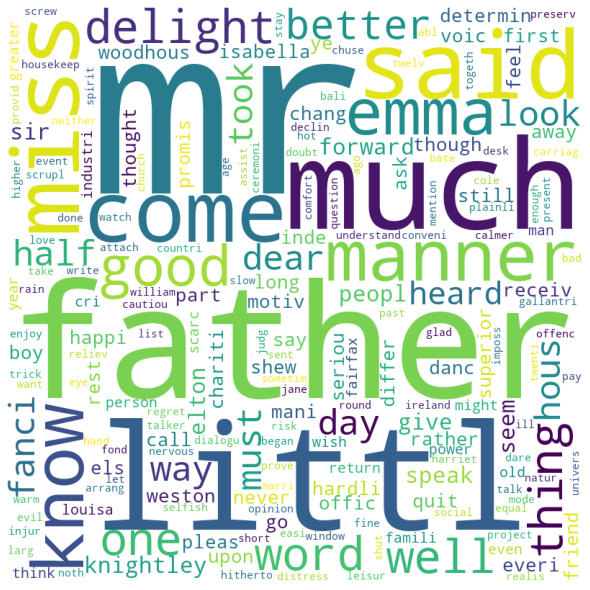

In [ ]:
if kappa_score != 1:
  error_prediction=compined_data[compined_data['cluster_name_agglomerative']!= compined_data['label']]

  error_text = error_prediction['Text_sample']
  worldcloud(error_text)
else:
  print('We can not plot word cloud for wordes here becuse no error her, Kappa score = 1.0')  

In [ ]:
from sklearn.metrics import silhouette_score
silhouette_score_hc=silhouette_score(X_bow, y_hc)
print(silhouette_score_hc)

0.06241064216112773


In [ ]:
cm_h = CoherenceModel(model =hc, topics=topics, 
                    texts=texts,
                    coherence='c_v',  
                    dictionary=word2id)

coherence_h = cm_h.get_coherence()  # get coherence value
print(coherence_h)

0.620658216925428


In [ ]:
overall['AgglomerativeClustering_pow']['Kappa_Score']=kappa_score
overall['AgglomerativeClustering_pow']['silhouette_score']=silhouette_score_hc
overall['AgglomerativeClustering_pow']['coherence_score']=coherence
overall['AgglomerativeClustering_pow']



{'Kappa_Score': 0.25,
 'coherence_score': 0.620658216925428,
 'silhouette_score': 0.06241064216112773}

# GaussianMixture with bow

In [ ]:
gmm = GaussianMixture(n_components=5)
gmm.fit(X_bow)
labels = gmm.predict(X_bow)

## GaussianMixture with bow Clusters Vistualization

> Indented block



/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.011s...
[t-SNE] Computed neighbors for 1000 samples in 0.382s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 2.611634
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.102852
[t-SNE] KL divergence after 1000 iterations: 1.304622


[Text(0.5, 1.0, 'Gaussian Mixture T-SNE projection')]

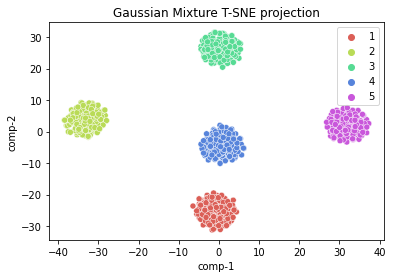

In [ ]:
# Clusters Visualization
tsne = TSNE(n_components=2, verbose=1, random_state=42)
z = tsne.fit_transform(X_bow)

tsne_df = pd.DataFrame()
tsne_df["y"] = y
tsne_df["comp-1"] = z[:,0]
tsne_df["comp-2"] = z[:,1]

sns.scatterplot(x="comp-1", y="comp-2", hue=tsne_df.y.tolist(),
                palette=sns.color_palette("hls", 5),
                data=tsne_df).set(title="Gaussian Mixture T-SNE projection") 

In [ ]:
labels_G = pd.Series(labels)
labels_G

0      0
1      0
2      0
3      0
4      0
      ..
995    4
996    4
997    4
998    4
999    4
Length: 1000, dtype: int64

In [ ]:
labels_G.value_counts()

0    200
1    200
3    200
2    200
4    200
dtype: int64

In [ ]:
gmm_results = pd.DataFrame(labels_G, columns=['Cluster'])

gmm_results

,Cluster
0,0
1,0
2,0
3,0
4,0
...,...
995,4
996,4
997,4
998,4


In [ ]:
compined_data = pd.concat([gmm_results, df_final],axis = 1)

compined_data

,Cluster,Text_sample_,label,Text_sample
0,0,"[happen, shock, discreetli, jane, unworthi, se...",1,happen shock discreetli jane unworthi send son...
1,0,"[nice, societi, could, question, bye, determin...",1,nice societi could question bye determin wheth...
2,0,"[flirtat, temper, without, someth, side, last,...",1,flirtat temper without someth side last nobodi...
3,0,"[servic, prevent, forgot, give, utter, name, m...",1,servic prevent forgot give utter name mr talk ...
4,0,"[health, repeat, isabella, hesit, sigh, snow, ...",1,health repeat isabella hesit sigh snow held wo...
...,...,...,...,...
995,4,"[year, pathway, pain, dear, rick, pass, futur,...",5,year pathway pain dear rick pass futur larg ge...
996,4,"[forc, shot, build, veda, sail, well, day, sha...",5,forc shot build veda sail well day shark word ...
997,4,"[like, soldier, much, continu, see, shallow, d...",5,like soldier much continu see shallow dropt re...
998,4,"[thunder, spirit, good, command, passion, mani...",5,thunder spirit good command passion mani festi...


In [ ]:
zero_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 0]['label']))[0][0]
one_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 1]['label']))[0][0]
two_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 2]['label']))[0][0]
three_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 3]['label']))[0][0]
four_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 4]['label']))[0][0]

/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:498: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  counts = np.zeros(a_view.shape[:-1], dtype=np.int)
/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:498: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the r

In [ ]:
compined_data['cluster_name'] = compined_data['Cluster'].map({0:zero_map_val, 
                                                              1:one_map_val,
                                                              2:two_map_val,
                                                              3:three_map_val, 
                                                              4:four_map_val})

##GaussianMixture with pow kappa score

In [ ]:
from sklearn.metrics import cohen_kappa_score
kappa_score = cohen_kappa_score(compined_data['cluster_name'],compined_data['label'])
kappa_score

1.0

## GaussianMixture with pow error analysis draw word cloud for mistaks words 

In [ ]:
if kappa_score != 1:
  error_prediction=compined_data[compined_data['cluster_name']!= compined_data['label']]

  error_text = error_prediction['Text_sample']
  worldcloud(error_text)
else:
  print('We can not plot word cloud for wordes here becuse no error her, Kappa score = 1.0') 

We can not plot word cloud for wordes here becuse no error her, Kappa score = 1.0


# GaussianMixture with bow silhouette_score

In [ ]:
from sklearn.metrics import silhouette_score

silhouette_score=silhouette_score(X_bow,labels)
print(silhouette_score)

0.06269148943904608


# coherence score for GaussianMixture with pow 

In [ ]:
cm_em = CoherenceModel(model =gmm, topics=topics, 
                    texts=texts,
                    coherence='c_v',  
                    dictionary=word2id)

coherence_em = cm_em.get_coherence()  # get coherence value
print(coherence_em)

0.620658216925428


In [ ]:
overall['GaussianMixture_pow']['Kappa_Score']=kappa_score
overall['GaussianMixture_pow']['silhouette_score']=silhouette_score
overall['GaussianMixture_pow']['coherence_score']=coherence
overall['GaussianMixture_pow']


{'Kappa_Score': 1.0,
 'coherence_score': 0.620658216925428,
 'silhouette_score': 0.06269148943904608}

#word to vec





In [ ]:
id2word = Dictionary(texts)
# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# Lda Model 

In [ ]:
lda_model = LdaModel(corpus=corpus,
                   id2word=id2word,
                   num_topics=5, 
                   random_state=0,
                   chunksize=100,
                   alpha='auto',
                   per_word_topics=True)

print(lda_model.print_topics())
doc_lda = lda_model[corpus]

/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

[(0, '0.020*"said" + 0.017*"alic" + 0.009*"one" + 0.009*"look" + 0.007*"like" + 0.007*"know" + 0.006*"would" + 0.006*"see" + 0.006*"long" + 0.006*"well"'), (1, '0.008*"thee" + 0.007*"shall" + 0.007*"thou" + 0.007*"soul" + 0.006*"day" + 0.006*"earth" + 0.006*"thi" + 0.006*"love" + 0.006*"men" + 0.005*"man"'), (2, '0.006*"said" + 0.006*"hand" + 0.006*"go" + 0.005*"one" + 0.005*"day" + 0.005*"upon" + 0.005*"come" + 0.004*"shall" + 0.004*"lord" + 0.004*"good"'), (3, '0.018*"said" + 0.009*"littl" + 0.008*"look" + 0.008*"know" + 0.008*"see" + 0.007*"one" + 0.007*"well" + 0.007*"mr" + 0.006*"would" + 0.006*"old"'), (4, '0.009*"said" + 0.006*"shall" + 0.006*"king" + 0.005*"come" + 0.005*"one" + 0.004*"hand" + 0.004*"man" + 0.004*"old" + 0.004*"upon" + 0.003*"sound"')]


In [ ]:
coherence_model_lda = CoherenceModel(model=lda_model, texts=texts, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print(coherence_lda)

0.37455335090063346


In [ ]:
pyLDAvis.enable_notebook()
p = gensimvis.prepare(lda_model, corpus, id2word)
p

/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  by='saliency', ascending=False).head(R).drop('saliency', 1)


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1     -0.172825  0.058882       1        1  29.036655
3      0.136938 -0.037318       2        1  28.852559
0      0.139801  0.079952       3        1  20.872088
2     -0.035539 -0.086250       4        1  15.286503
4     -0.068375 -0.015266       5        1   5.952196, topic_info=       Term         Freq        Total Category  logprob  loglift
5438   alic   755.000000   755.000000  Default  30.0000  30.0000
193    said  1716.000000  1716.000000  Default  29.0000  29.0000
2773   thou   318.000000   318.000000  Default  28.0000  28.0000
371   shall   521.000000   521.000000  Default  27.0000  27.0000
3048   thee   370.000000   370.000000  Default  26.0000  26.0000
...     ...          ...          ...      ...      ...      ...
158    good    23.942583   460.451679   Topic5  -5.9213  -0.1351
83      say    23.070595   482.963914   Topic5  -5.9584  -0.2200
53     know    23.888645   695.606005   Topic5  -5.9236  -0.5500
57     long    22.183606   566.747304   Topic5  -5.9976  -0.4192
273    love    21.056128   476.956685   Topic5  -6.0498  -0.2988

[424 rows x 6 columns], token_table=      Topic      Freq   Term
term                        
4023      3  0.164690   afor
4023      4  0.164690   afor
4023      5  0.658762   afor
6751      2  0.143911  agent
6751      4  0.143911  agent
...     ...       ...    ...
224       1  0.375230    yet
224       2  0.167805    yet
224       3  0.188780    yet
224       4  0.198103    yet
224       5  0.067588    yet

[1123 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 4, 1, 3, 5])

#  Apply the last same steps but with less feature

In [ ]:
bow= CountVectorizer(max_features= 2000)
X_bow_2000 = bow.fit_transform(X).toarray()

In [ ]:
pd.DataFrame(X_bow_2000,columns=bow.get_feature_names())

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,aaron,abbey,abl,abomin,abraham,absenc,absent,absolut,absorb,accept,...,ye,yea,year,yellow,yesterday,yet,yield,young,youth,zion
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,2,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,1,0,0
996,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
997,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
998,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


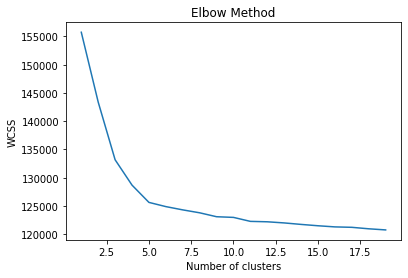

In [ ]:
wcss = []
for i in range(1, 20):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=0)
    kmeans.fit(X_bow_2000)
    wcss.append(kmeans.inertia_)
plt.plot(range(1, 20), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

# K-means with pow 2000 features

In [ ]:
kmeans_2000 = KMeans(n_clusters=5, init='k-means++',random_state=0)
pred_y_2000 = kmeans_2000.fit_predict(X_bow_2000)

## ClustersK-means with pow 2000 Clusters Visualization Visualization

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.001s...
[t-SNE] Computed neighbors for 1000 samples in 0.086s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 2.615354
[t-SNE] KL divergence after 250 iterations with early exaggeration: 72.058273
[t-SNE] KL divergence after 1000 iterations: 1.385162


[Text(0.5, 1.0, 'kmeans 2000 T-SNE projection')]

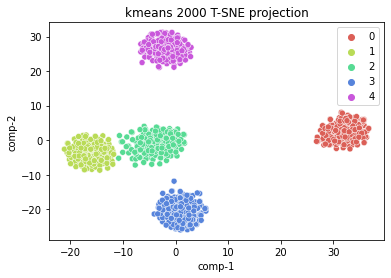

In [ ]:
# Clusters Visualization
tsne = TSNE(n_components=2, verbose=1, random_state=42)
z = tsne.fit_transform(X_bow_2000)

tsne_df = pd.DataFrame()
tsne_df["y"] = pred_y_2000
tsne_df["comp-1"] = z[:,0]
tsne_df["comp-2"] = z[:,1]

sns.scatterplot(x="comp-1", y="comp-2", hue=tsne_df.y.tolist(),
                palette=sns.color_palette("hls", 5),
                data=tsne_df).set(title="kmeans 2000 T-SNE projection") 

In [ ]:
kmeans_2000_results = pd.DataFrame(pred_y_2000, columns=['Cluster'])

kmeans_2000_results

,Cluster
0,3
1,3
2,3
3,3
4,3
...,...
995,1
996,1
997,1
998,1


In [ ]:
compined_data = pd.concat([kmeans_2000_results, df_final],axis = 1)

compined_data

,Cluster,Text_sample_,label,Text_sample
0,3,"[happen, shock, discreetli, jane, unworthi, se...",1,happen shock discreetli jane unworthi send son...
1,3,"[nice, societi, could, question, bye, determin...",1,nice societi could question bye determin wheth...
2,3,"[flirtat, temper, without, someth, side, last,...",1,flirtat temper without someth side last nobodi...
3,3,"[servic, prevent, forgot, give, utter, name, m...",1,servic prevent forgot give utter name mr talk ...
4,3,"[health, repeat, isabella, hesit, sigh, snow, ...",1,health repeat isabella hesit sigh snow held wo...
...,...,...,...,...
995,1,"[year, pathway, pain, dear, rick, pass, futur,...",5,year pathway pain dear rick pass futur larg ge...
996,1,"[forc, shot, build, veda, sail, well, day, sha...",5,forc shot build veda sail well day shark word ...
997,1,"[like, soldier, much, continu, see, shallow, d...",5,like soldier much continu see shallow dropt re...
998,1,"[thunder, spirit, good, command, passion, mani...",5,thunder spirit good command passion mani festi...


In [ ]:

zero_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 0]['label']))[0][0]
one_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 1]['label']))[0][0]
two_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 2]['label']))[0][0]
three_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 3]['label']))[0][0]
four_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 4]['label']))[0][0]

/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:498: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  counts = np.zeros(a_view.shape[:-1], dtype=np.int)
/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:498: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the r

In [ ]:
compined_data['cluster_name_for_2000_bw'] = compined_data['Cluster'].map({0:zero_map_val, 
                                                                          1:one_map_val,
                                                                          2:two_map_val,
                                                                          3:three_map_val, 
                                                                          4:four_map_val})

compined_data

,Cluster,Text_sample_,label,Text_sample,cluster_name_for_2000_bw
0,3,"[happen, shock, discreetli, jane, unworthi, se...",1,happen shock discreetli jane unworthi send son...,1
1,3,"[nice, societi, could, question, bye, determin...",1,nice societi could question bye determin wheth...,1
2,3,"[flirtat, temper, without, someth, side, last,...",1,flirtat temper without someth side last nobodi...,1
3,3,"[servic, prevent, forgot, give, utter, name, m...",1,servic prevent forgot give utter name mr talk ...,1
4,3,"[health, repeat, isabella, hesit, sigh, snow, ...",1,health repeat isabella hesit sigh snow held wo...,1
...,...,...,...,...,...
995,1,"[year, pathway, pain, dear, rick, pass, futur,...",5,year pathway pain dear rick pass futur larg ge...,5
996,1,"[forc, shot, build, veda, sail, well, day, sha...",5,forc shot build veda sail well day shark word ...,5
997,1,"[like, soldier, much, continu, see, shallow, d...",5,like soldier much continu see shallow dropt re...,5
998,1,"[thunder, spirit, good, command, passion, mani...",5,thunder spirit good command passion mani festi...,5


# K-means with pow 2000 kapp score

In [ ]:
from sklearn.metrics import cohen_kappa_score
kappa_score = cohen_kappa_score(compined_data['cluster_name_for_2000_bw'],compined_data['label'])
kappa_score 

1.0

# k-means with pow 2000 error analysis draw word cloud for mistaks words

In [ ]:
if kappa_score != 1:
  error_prediction=compined_data[compined_data['cluster_name_for_2000_bw']!= compined_data['label']]

  error_text = error_prediction['Text_sample']
  worldcloud(error_text)
else:
  print('We can not plot word cloud for wordes here becuse no error her, Kappa score = 1.0') 

We can not plot word cloud for wordes here becuse no error her, Kappa score = 1.0


# K-means with pow 2000 silhouette score

In [ ]:
from sklearn.metrics import silhouette_score
silhouette_score=silhouette_score(X_bow_2000,pred_y_2000)
print(silhouette_score)

0.06306755240964947


# K-means with pow 2000 coherence score

In [ ]:
cm = CoherenceModel(model =kmeans_2000, topics=topics, 
                    texts=texts,
                    coherence='c_v',  
                    dictionary=word2id)

coherence = cm.get_coherence()  # get coherence value
print(coherence)

0.620658216925428


In [ ]:
overall['kmeans_pow_2000']['Kappa_Score']=kappa_score
overall['kmeans_pow_2000']['silhouette_score']=silhouette_score
overall['kmeans_pow_2000']['coherence_score']=coherence
overall['kmeans_pow_2000']




{'Kappa_Score': 1.0,
 'coherence_score': 0.620658216925428,
 'silhouette_score': 0.06306755240964947}

{'color_list': ['g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',

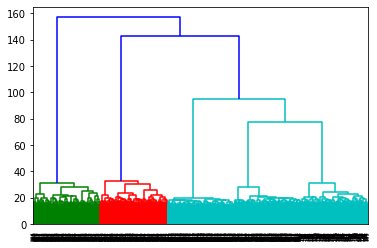

In [ ]:
dendrogram_2000 = sch.dendrogram(sch.linkage(X_bow_2000, method='ward'))
dendrogram_2000

# AgglomerativeClustering with pow 2000

In [ ]:
hc_2000 = AgglomerativeClustering(n_clusters=5, affinity = 'euclidean', linkage = 'ward')
y_hc_2000 = hc_2000.fit_predict(X_bow_2000)

## AgglomerativeClustering with pow 2000 Clusters Visualization

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.001s...
[t-SNE] Computed neighbors for 1000 samples in 0.110s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 2.615354
[t-SNE] KL divergence after 250 iterations with early exaggeration: 72.058273
[t-SNE] KL divergence after 1000 iterations: 1.385162


[Text(0.5, 1.0, 'Agglomerative 2000 T-SNE projection')]

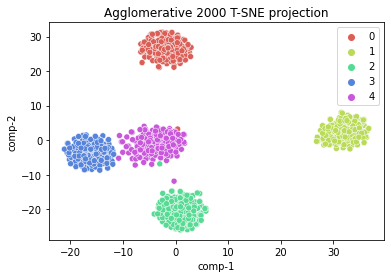

In [ ]:
# Clusters Visualization
tsne = TSNE(n_components=2, verbose=1, random_state=42)
z = tsne.fit_transform(X_bow_2000)

tsne_df = pd.DataFrame()
tsne_df["y"] = y_hc_2000
tsne_df["comp-1"] = z[:,0]
tsne_df["comp-2"] = z[:,1]

sns.scatterplot(x="comp-1", y="comp-2", hue=tsne_df.y.tolist(),
                palette=sns.color_palette("hls", 5),
                data=tsne_df).set(title="Agglomerative 2000 T-SNE projection") 

In [ ]:
agglomerative_clustering_2000_results = pd.DataFrame(y_hc_2000, columns=['Cluster'])

agglomerative_clustering_2000_results

,Cluster
0,2
1,2
2,2
3,2
4,2
...,...
995,3
996,3
997,3
998,3


In [ ]:
compined_data = pd.concat([agglomerative_clustering_2000_results, df_final],axis = 1)

compined_data

,Cluster,Text_sample_,label,Text_sample
0,2,"[happen, shock, discreetli, jane, unworthi, se...",1,happen shock discreetli jane unworthi send son...
1,2,"[nice, societi, could, question, bye, determin...",1,nice societi could question bye determin wheth...
2,2,"[flirtat, temper, without, someth, side, last,...",1,flirtat temper without someth side last nobodi...
3,2,"[servic, prevent, forgot, give, utter, name, m...",1,servic prevent forgot give utter name mr talk ...
4,2,"[health, repeat, isabella, hesit, sigh, snow, ...",1,health repeat isabella hesit sigh snow held wo...
...,...,...,...,...
995,3,"[year, pathway, pain, dear, rick, pass, futur,...",5,year pathway pain dear rick pass futur larg ge...
996,3,"[forc, shot, build, veda, sail, well, day, sha...",5,forc shot build veda sail well day shark word ...
997,3,"[like, soldier, much, continu, see, shallow, d...",5,like soldier much continu see shallow dropt re...
998,3,"[thunder, spirit, good, command, passion, mani...",5,thunder spirit good command passion mani festi...


In [ ]:
zero_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 0]['label']))[0][0]
one_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 1]['label']))[0][0]
two_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 2]['label']))[0][0]
three_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 3]['label']))[0][0]
four_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 4]['label']))[0][0]

/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:498: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  counts = np.zeros(a_view.shape[:-1], dtype=np.int)
/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:498: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the r

In [ ]:
compined_data['cluster_agglomerative_clustering_2000_name'] = compined_data['Cluster'].map({0:zero_map_val, 
                                                                                            1:one_map_val,
                                                                                            2:two_map_val,
                                                                                            3:three_map_val, 
                                                                                            4:four_map_val})

compined_data

,Cluster,Text_sample_,label,Text_sample,cluster_agglomerative_clustering_2000_name
0,2,"[happen, shock, discreetli, jane, unworthi, se...",1,happen shock discreetli jane unworthi send son...,1
1,2,"[nice, societi, could, question, bye, determin...",1,nice societi could question bye determin wheth...,1
2,2,"[flirtat, temper, without, someth, side, last,...",1,flirtat temper without someth side last nobodi...,1
3,2,"[servic, prevent, forgot, give, utter, name, m...",1,servic prevent forgot give utter name mr talk ...,1
4,2,"[health, repeat, isabella, hesit, sigh, snow, ...",1,health repeat isabella hesit sigh snow held wo...,1
...,...,...,...,...,...
995,3,"[year, pathway, pain, dear, rick, pass, futur,...",5,year pathway pain dear rick pass futur larg ge...,5
996,3,"[forc, shot, build, veda, sail, well, day, sha...",5,forc shot build veda sail well day shark word ...,5
997,3,"[like, soldier, much, continu, see, shallow, d...",5,like soldier much continu see shallow dropt re...,5
998,3,"[thunder, spirit, good, command, passion, mani...",5,thunder spirit good command passion mani festi...,5


##AgglomerativeClustering with pow 2000 Kappa Score

In [ ]:
from sklearn.metrics import cohen_kappa_score
kappa_score = cohen_kappa_score(compined_data['cluster_agglomerative_clustering_2000_name'],compined_data['label'])
kappa_score 

0.99625

## AgglomerativeClustering with pow 2000 error analysis draw word cloud for mistaks words

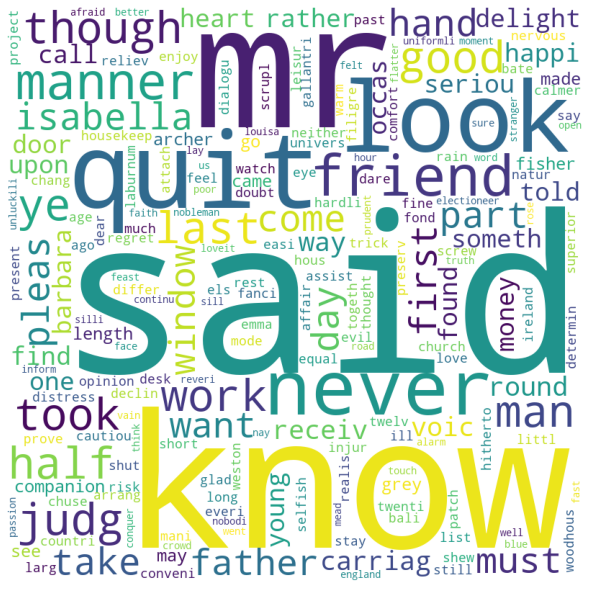

In [ ]:
if kappa_score != 1:
  error_prediction=compined_data[compined_data['cluster_agglomerative_clustering_2000_name']!= compined_data['label']]

  error_text = error_prediction['Text_sample']
  worldcloud(error_text)
else:
  print('We can not plot word cloud for wordes here becuse no error her, Kappa score = 1.0')

# AgglomerativeClustering with pow 2000 silhouette_score

In [ ]:
from sklearn.metrics import silhouette_score

silhouette_score=silhouette_score(X_bow_2000,y_hc_2000)
print(silhouette_score)

0.06269613596233263


#  AgglomerativeClustering with pow 2000 coherence_score

In [ ]:
cm_h = CoherenceModel(model =hc_2000, topics=topics, 
                    texts=texts,
                    coherence='c_v',  
                    dictionary=word2id)

coherence_h = cm_h.get_coherence()  # get coherence value
print(coherence_h)

0.620658216925428


In [ ]:
overall['AgglomerativeClustering_pow_2000']['Kappa_Score']=kappa_score
overall['AgglomerativeClustering_pow_2000']['silhouette_score']=silhouette_score
overall['AgglomerativeClustering_pow_2000']['coherence_score']=coherence_h

# GaussianMixture with pow 2000 

In [ ]:
gmm_2000 = GaussianMixture(n_components=5)
gmm_2000.fit(X_bow_2000)
labels_2000 = gmm_2000.predict(X_bow_2000)

## GaussianMixture with pow 2000 Clusters Vistualization

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.002s...
[t-SNE] Computed neighbors for 1000 samples in 0.083s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 2.615354
[t-SNE] KL divergence after 250 iterations with early exaggeration: 72.058273
[t-SNE] KL divergence after 1000 iterations: 1.385162


[Text(0.5, 1.0, 'Gaussian Mixture 2000 T-SNE projection')]

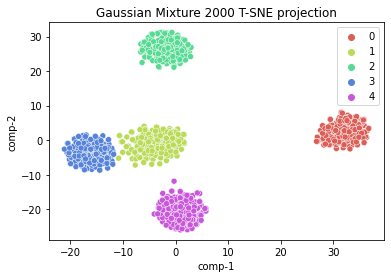

In [ ]:
# Clusters Visualization
tsne = TSNE(n_components=2, verbose=1, random_state=42)
z = tsne.fit_transform(X_bow_2000)

tsne_df = pd.DataFrame()
tsne_df["y"] = labels_2000
tsne_df["comp-1"] = z[:,0]
tsne_df["comp-2"] = z[:,1]

sns.scatterplot(x="comp-1", y="comp-2", hue=tsne_df.y.tolist(),
                palette=sns.color_palette("hls", 5),
                data=tsne_df).set(title="Gaussian Mixture 2000 T-SNE projection") 

In [ ]:
gmm_2000_results = pd.DataFrame(labels_2000, columns=['Cluster'])

gmm_2000_results

,Cluster
0,4
1,4
2,4
3,4
4,4
...,...
995,3
996,3
997,3
998,3


In [ ]:
compined_data = pd.concat([gmm_2000_results, df_final],axis = 1)

compined_data

,Cluster,Text_sample_,label,Text_sample
0,4,"[happen, shock, discreetli, jane, unworthi, se...",1,happen shock discreetli jane unworthi send son...
1,4,"[nice, societi, could, question, bye, determin...",1,nice societi could question bye determin wheth...
2,4,"[flirtat, temper, without, someth, side, last,...",1,flirtat temper without someth side last nobodi...
3,4,"[servic, prevent, forgot, give, utter, name, m...",1,servic prevent forgot give utter name mr talk ...
4,4,"[health, repeat, isabella, hesit, sigh, snow, ...",1,health repeat isabella hesit sigh snow held wo...
...,...,...,...,...
995,3,"[year, pathway, pain, dear, rick, pass, futur,...",5,year pathway pain dear rick pass futur larg ge...
996,3,"[forc, shot, build, veda, sail, well, day, sha...",5,forc shot build veda sail well day shark word ...
997,3,"[like, soldier, much, continu, see, shallow, d...",5,like soldier much continu see shallow dropt re...
998,3,"[thunder, spirit, good, command, passion, mani...",5,thunder spirit good command passion mani festi...


In [ ]:
zero_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 0]['label']))[0][0]
one_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 1]['label']))[0][0]
two_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 2]['label']))[0][0]
three_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 3]['label']))[0][0]
four_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 4]['label']))[0][0]

/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:498: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  counts = np.zeros(a_view.shape[:-1], dtype=np.int)
/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:498: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the r

In [ ]:
compined_data['gmm_2000_name'] = compined_data['Cluster'].map({0:zero_map_val, 
                                                              1:one_map_val,
                                                              2:two_map_val,
                                                              3:three_map_val, 
                                                              4:four_map_val})

compined_data

,Cluster,Text_sample_,label,Text_sample,gmm_2000_name
0,4,"[happen, shock, discreetli, jane, unworthi, se...",1,happen shock discreetli jane unworthi send son...,1
1,4,"[nice, societi, could, question, bye, determin...",1,nice societi could question bye determin wheth...,1
2,4,"[flirtat, temper, without, someth, side, last,...",1,flirtat temper without someth side last nobodi...,1
3,4,"[servic, prevent, forgot, give, utter, name, m...",1,servic prevent forgot give utter name mr talk ...,1
4,4,"[health, repeat, isabella, hesit, sigh, snow, ...",1,health repeat isabella hesit sigh snow held wo...,1
...,...,...,...,...,...
995,3,"[year, pathway, pain, dear, rick, pass, futur,...",5,year pathway pain dear rick pass futur larg ge...,5
996,3,"[forc, shot, build, veda, sail, well, day, sha...",5,forc shot build veda sail well day shark word ...,5
997,3,"[like, soldier, much, continu, see, shallow, d...",5,like soldier much continu see shallow dropt re...,5
998,3,"[thunder, spirit, good, command, passion, mani...",5,thunder spirit good command passion mani festi...,5


# GaussianMixture with pow 2000 silhouette_score

In [ ]:
from sklearn.metrics import cohen_kappa_score
kappa_score = cohen_kappa_score(compined_data['gmm_2000_name'],compined_data['label'])
kappa_score 

1.0

## GaussianMixture with pow 2000 error analysis draw word cloud for mistaks words

In [ ]:
if kappa_score != 1:
  error_prediction=compined_data[compined_data['gmm_2000_name']!= compined_data['label']]

  error_text = error_prediction['Text_sample']
  worldcloud(error_text)
else:
  print('We can not plot word cloud for wordes here becuse no error her, Kappa score = 1.0')

We can not plot word cloud for wordes here becuse no error her, Kappa score = 1.0


In [ ]:
from sklearn.metrics import silhouette_score

silhouette_score=silhouette_score(X_bow_2000,labels_2000)
print(silhouette_score)

0.06306755240964947


# GaussianMixture with pow 2000 coherence score

In [ ]:
cm_em = CoherenceModel(model =gmm_2000, topics=topics, 
                    texts=texts,
                    coherence='c_v',  
                    dictionary=word2id)

coherence_em = cm_em.get_coherence()  # get coherence value
print(coherence_em)

0.620658216925428


In [ ]:
overall['GaussianMixture_pow_2000']['Kappa_Score']=kappa_score
overall['GaussianMixture_pow_2000']['silhouette_score']=silhouette_score
overall['GaussianMixture_pow_2000']['coherence_score']=coherence_em

# Apply TF-IDF

In [ ]:
tf = TfidfVectorizer()
X_tf=tf.fit_transform(X).toarray()

In [ ]:
pd.DataFrame(X_tf,columns=tf.get_feature_names())

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,aaron,aaronit,abandon,abarim,abas,abash,abat,abbey,abbot,abda,...,zin,zion,zoar,zobah,zobebah,zone,zophah,zophim,zuph,zur
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.092679,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


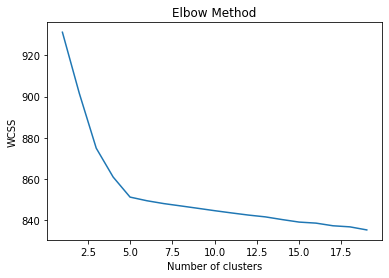

In [ ]:
wcss = []
for i in range(1, 20):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=0)
    kmeans.fit(X_tf)
    wcss.append(kmeans.inertia_)
plt.plot(range(1, 20), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

# k-means with Tf Idf 

In [ ]:
kmeans_tf = KMeans(n_clusters=5, init='k-means++',random_state=0)
pred_y_tf = kmeans_tf.fit_predict(X_tf)

##  k-means with Tf Idf Clusters Visualization

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.007s...
[t-SNE] Computed neighbors for 1000 samples in 0.178s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 0.156879
[t-SNE] KL divergence after 250 iterations with early exaggeration: 69.298187
[t-SNE] KL divergence after 1000 iterations: 1.471956


[Text(0.5, 1.0, 'kmeans TF T-SNE projection')]

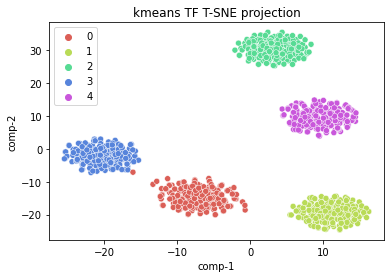

In [ ]:
# Clusters Visualization
tsne = TSNE(n_components=2, verbose=1, random_state=42)
z = tsne.fit_transform(X_tf)

tsne_df = pd.DataFrame()
tsne_df["y"] = pred_y_tf
tsne_df["comp-1"] = z[:,0]
tsne_df["comp-2"] = z[:,1]

sns.scatterplot(x="comp-1", y="comp-2", hue=tsne_df.y.tolist(),
                palette=sns.color_palette("hls", 5),
                data=tsne_df).set(title="kmeans TF T-SNE projection") 

In [ ]:
kmean_results_tf = pd.DataFrame(pred_y_tf, columns=['Cluster'])

kmean_results_tf

,Cluster
0,3
1,3
2,3
3,3
4,3
...,...
995,4
996,4
997,4
998,4


In [ ]:
compined_data = pd.concat([kmean_results_tf, df_final],axis = 1)

compined_data

,Cluster,Text_sample_,label,Text_sample
0,3,"[happen, shock, discreetli, jane, unworthi, se...",1,happen shock discreetli jane unworthi send son...
1,3,"[nice, societi, could, question, bye, determin...",1,nice societi could question bye determin wheth...
2,3,"[flirtat, temper, without, someth, side, last,...",1,flirtat temper without someth side last nobodi...
3,3,"[servic, prevent, forgot, give, utter, name, m...",1,servic prevent forgot give utter name mr talk ...
4,3,"[health, repeat, isabella, hesit, sigh, snow, ...",1,health repeat isabella hesit sigh snow held wo...
...,...,...,...,...
995,4,"[year, pathway, pain, dear, rick, pass, futur,...",5,year pathway pain dear rick pass futur larg ge...
996,4,"[forc, shot, build, veda, sail, well, day, sha...",5,forc shot build veda sail well day shark word ...
997,4,"[like, soldier, much, continu, see, shallow, d...",5,like soldier much continu see shallow dropt re...
998,4,"[thunder, spirit, good, command, passion, mani...",5,thunder spirit good command passion mani festi...


In [ ]:
zero_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 0]['label']))[0][0]
one_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 1]['label']))[0][0]
two_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 2]['label']))[0][0]
three_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 3]['label']))[0][0]
four_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 4]['label']))[0][0]

/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:498: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  counts = np.zeros(a_view.shape[:-1], dtype=np.int)
/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:498: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the r

In [ ]:
compined_data['cluster_name_tf'] = compined_data['Cluster'].map({0:zero_map_val, 
                                                                1:one_map_val,
                                                                2:two_map_val,
                                                                3:three_map_val, 
                                                                4:four_map_val})

compined_data

,Cluster,Text_sample_,label,Text_sample,cluster_name_tf
0,3,"[happen, shock, discreetli, jane, unworthi, se...",1,happen shock discreetli jane unworthi send son...,1
1,3,"[nice, societi, could, question, bye, determin...",1,nice societi could question bye determin wheth...,1
2,3,"[flirtat, temper, without, someth, side, last,...",1,flirtat temper without someth side last nobodi...,1
3,3,"[servic, prevent, forgot, give, utter, name, m...",1,servic prevent forgot give utter name mr talk ...,1
4,3,"[health, repeat, isabella, hesit, sigh, snow, ...",1,health repeat isabella hesit sigh snow held wo...,1
...,...,...,...,...,...
995,4,"[year, pathway, pain, dear, rick, pass, futur,...",5,year pathway pain dear rick pass futur larg ge...,5
996,4,"[forc, shot, build, veda, sail, well, day, sha...",5,forc shot build veda sail well day shark word ...,5
997,4,"[like, soldier, much, continu, see, shallow, d...",5,like soldier much continu see shallow dropt re...,5
998,4,"[thunder, spirit, good, command, passion, mani...",5,thunder spirit good command passion mani festi...,5


##  k-means with Tf Idf Kappa Score


In [ ]:
from sklearn.metrics import cohen_kappa_score
kappa_score = cohen_kappa_score(compined_data['cluster_name_tf'],compined_data['label'])
kappa_score 

1.0

## error analysis k-means draw word cloud for mestaks words

In [ ]:
if kappa_score != 1:
  error_prediction=compined_data[compined_data['cluster_name']!= compined_data['label']]

  error_text = error_prediction['Text_sample']
  worldcloud(error_text)
else:
  print('We can not plot word cloud for wordes here becuse no error her, Kappa score = 1.0')  

We can not plot word cloud for wordes here becuse no error her, Kappa score = 1.0


## k-means with Tf-Idf silhouette_score

In [ ]:
from sklearn.metrics import silhouette_score

silhouette_score=silhouette_score(X_tf,pred_y_tf)
print(silhouette_score)

0.044822658598994196


## k-means with Tf-Idf coherence_score

In [ ]:
cm = CoherenceModel(model = kmeans_tf, topics=topics, 
                    texts=texts,
                    coherence='c_v',  
                    dictionary=word2id)

coherence = cm.get_coherence() 
print(coherence)

0.620658216925428


In [ ]:
overall['kmeans_tf']['Kappa_Score']=kappa_score
overall['kmeans_tf']['silhouette_score']=silhouette_score
overall['kmeans_tf']['coherence_score']=coherence

{'color_list': ['g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',
  'g',

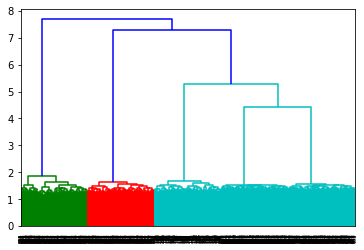

In [ ]:
dendrogram_tf = sch.dendrogram(sch.linkage(X_tf, method='ward'))
dendrogram_tf

## AgglomerativeClustering with Tf-Idf

In [ ]:
hc_tf = AgglomerativeClustering(n_clusters=5, affinity = 'euclidean', linkage = 'ward')
y_hc_tf = hc_tf.fit_predict(X_tf)

## AgglomerativeClustering with Tf-Idf Clusters Visualization

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.006s...
[t-SNE] Computed neighbors for 1000 samples in 0.177s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 0.156879
[t-SNE] KL divergence after 250 iterations with early exaggeration: 69.298187
[t-SNE] KL divergence after 1000 iterations: 1.471956


[Text(0.5, 1.0, 'Agglomerative TF T-SNE projection')]

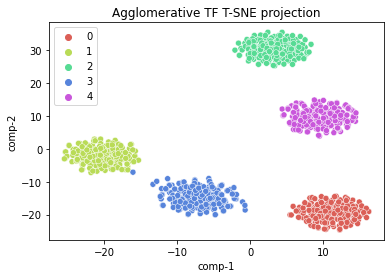

In [ ]:
# Clusters Visualization
tsne = TSNE(n_components=2, verbose=1, random_state=42)
z = tsne.fit_transform(X_tf)

tsne_df = pd.DataFrame()
tsne_df["y"] = y_hc_tf
tsne_df["comp-1"] = z[:,0]
tsne_df["comp-2"] = z[:,1]

sns.scatterplot(x="comp-1", y="comp-2", hue=tsne_df.y.tolist(),
                palette=sns.color_palette("hls", 5),
                data=tsne_df).set(title="Agglomerative TF T-SNE projection") 

In [ ]:
agg_cluster_tf_results = pd.DataFrame(y_hc_tf, columns=['Cluster'])

agg_cluster_tf_results

,Cluster
0,1
1,1
2,1
3,1
4,1
...,...
995,4
996,4
997,4
998,4


In [ ]:
compined_data = pd.concat([agg_cluster_tf_results, df_final],axis = 1)

compined_data

,Cluster,Text_sample_,label,Text_sample
0,1,"[happen, shock, discreetli, jane, unworthi, se...",1,happen shock discreetli jane unworthi send son...
1,1,"[nice, societi, could, question, bye, determin...",1,nice societi could question bye determin wheth...
2,1,"[flirtat, temper, without, someth, side, last,...",1,flirtat temper without someth side last nobodi...
3,1,"[servic, prevent, forgot, give, utter, name, m...",1,servic prevent forgot give utter name mr talk ...
4,1,"[health, repeat, isabella, hesit, sigh, snow, ...",1,health repeat isabella hesit sigh snow held wo...
...,...,...,...,...
995,4,"[year, pathway, pain, dear, rick, pass, futur,...",5,year pathway pain dear rick pass futur larg ge...
996,4,"[forc, shot, build, veda, sail, well, day, sha...",5,forc shot build veda sail well day shark word ...
997,4,"[like, soldier, much, continu, see, shallow, d...",5,like soldier much continu see shallow dropt re...
998,4,"[thunder, spirit, good, command, passion, mani...",5,thunder spirit good command passion mani festi...


In [ ]:
zero_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 0]['label']))[0][0]
one_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 1]['label']))[0][0]
two_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 2]['label']))[0][0]
three_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 3]['label']))[0][0]
four_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 4]['label']))[0][0]

/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:498: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  counts = np.zeros(a_view.shape[:-1], dtype=np.int)
/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:498: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the r

In [ ]:
compined_data['agg_cluster_tf_name'] = compined_data['Cluster'].map({0:zero_map_val, 
                                                                    1:one_map_val,
                                                                    2:two_map_val,
                                                                    3:three_map_val, 
                                                                    4:four_map_val})

compined_data

,Cluster,Text_sample_,label,Text_sample,agg_cluster_tf_name
0,1,"[happen, shock, discreetli, jane, unworthi, se...",1,happen shock discreetli jane unworthi send son...,1
1,1,"[nice, societi, could, question, bye, determin...",1,nice societi could question bye determin wheth...,1
2,1,"[flirtat, temper, without, someth, side, last,...",1,flirtat temper without someth side last nobodi...,1
3,1,"[servic, prevent, forgot, give, utter, name, m...",1,servic prevent forgot give utter name mr talk ...,1
4,1,"[health, repeat, isabella, hesit, sigh, snow, ...",1,health repeat isabella hesit sigh snow held wo...,1
...,...,...,...,...,...
995,4,"[year, pathway, pain, dear, rick, pass, futur,...",5,year pathway pain dear rick pass futur larg ge...,5
996,4,"[forc, shot, build, veda, sail, well, day, sha...",5,forc shot build veda sail well day shark word ...,5
997,4,"[like, soldier, much, continu, see, shallow, d...",5,like soldier much continu see shallow dropt re...,5
998,4,"[thunder, spirit, good, command, passion, mani...",5,thunder spirit good command passion mani festi...,5


## AgglomerativeClustering with Tf-Idf Kappa Score

In [ ]:
from sklearn.metrics import cohen_kappa_score
kappa_score = cohen_kappa_score(compined_data['agg_cluster_tf_name'],compined_data['label'])
kappa_score

1.0


## error analysis for AgglomerativeClustering with Tf-Idf draw word cloud for mistaks words

In [ ]:
if kappa_score != 1:
  error_prediction=compined_data[compined_data['agg_cluster_tf_name']!= compined_data['label']]

  error_text = error_prediction['Text_sample']
  worldcloud(error_text)
else:
  print('We can not plot word cloud for wordes here becuse no error her, Kappa score = 1.0')  

We can not plot word cloud for wordes here becuse no error her, Kappa score = 1.0


## AgglomerativeClustering with Tf-Idf silhouette score

In [ ]:
from sklearn.metrics import silhouette_score

silhouette_score=silhouette_score(X_tf,y_hc_tf)
print(silhouette_score)

0.044822658598994196


## AgglomerativeClustering with Tf-Idf coherence score


In [ ]:
cm_h = CoherenceModel(model =hc_tf, topics=topics, 
                    texts=texts,
                    coherence='c_v',  
                    dictionary=word2id)

coherence_h = cm_h.get_coherence()  # get coherence value
print(coherence_h)

0.620658216925428


In [ ]:
overall['AgglomerativeClustering_tf']['Kappa_Score']=kappa_score
overall['AgglomerativeClustering_tf']['silhouette_score']=silhouette_score
overall['AgglomerativeClustering_tf']['coherence_score']=coherence_h

## GaussianMixture with Tf-Idf 

In [ ]:
X_tf_pca=PCA(n_components=700)
x=X_tf_pca.fit_transform(X_tf)




/usr/local/lib/python3.7/dist-packages/scipy/linalg/decomp_qr.py:20: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  kwargs['lwork'] = ret[-2][0].real.astype(numpy.int)
/usr/local/lib/python3.7/dist-packages/scipy/linalg/decomp_qr.py:20: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, ch

In [ ]:
gmm_tf = GaussianMixture(n_components=5)
gmm_tf.fit(x)
labels_tf = gmm_tf.predict(x)

## Clusters Visualization for GaussianMixture with Tf-Idf 

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.010s...
[t-SNE] Computed neighbors for 1000 samples in 0.415s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 2.611634
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.102852
[t-SNE] KL divergence after 1000 iterations: 1.304622


[Text(0.5, 1.0, 'GaussianMixture TF T-SNE projection')]

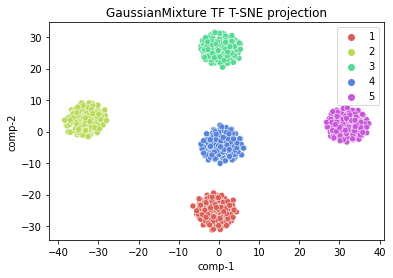

In [ ]:
# Clusters Visualization
tsne = TSNE(n_components=2, verbose=1, random_state=42)
z = tsne.fit_transform(X_bow)

tsne_df = pd.DataFrame()
tsne_df["y"] = y
tsne_df["comp-1"] = z[:,0]
tsne_df["comp-2"] = z[:,1]

sns.scatterplot(x="comp-1", y="comp-2", hue=tsne_df.y.tolist(),
                palette=sns.color_palette("hls", 5),
                data=tsne_df).set(title="GaussianMixture TF T-SNE projection") 

In [ ]:
gmm_results_tf = pd.DataFrame(labels_tf, columns=['Cluster'])

gmm_results_tf

,Cluster
0,1
1,1
2,1
3,1
4,1
...,...
995,4
996,4
997,4
998,4


In [ ]:
compined_data = pd.concat([gmm_results_tf, df_final],axis = 1)

compined_data

,Cluster,Text_sample_,label,Text_sample
0,1,"[happen, shock, discreetli, jane, unworthi, se...",1,happen shock discreetli jane unworthi send son...
1,1,"[nice, societi, could, question, bye, determin...",1,nice societi could question bye determin wheth...
2,1,"[flirtat, temper, without, someth, side, last,...",1,flirtat temper without someth side last nobodi...
3,1,"[servic, prevent, forgot, give, utter, name, m...",1,servic prevent forgot give utter name mr talk ...
4,1,"[health, repeat, isabella, hesit, sigh, snow, ...",1,health repeat isabella hesit sigh snow held wo...
...,...,...,...,...
995,4,"[year, pathway, pain, dear, rick, pass, futur,...",5,year pathway pain dear rick pass futur larg ge...
996,4,"[forc, shot, build, veda, sail, well, day, sha...",5,forc shot build veda sail well day shark word ...
997,4,"[like, soldier, much, continu, see, shallow, d...",5,like soldier much continu see shallow dropt re...
998,4,"[thunder, spirit, good, command, passion, mani...",5,thunder spirit good command passion mani festi...


In [ ]:
compined_data['cluster_name_tf'] = compined_data['Cluster'].map({0:zero_map_val, 
                                                                1:one_map_val,
                                                                2:two_map_val,
                                                                3:three_map_val, 
                                                                4:four_map_val})

compined_data

,Cluster,Text_sample_,label,Text_sample,cluster_name_tf
0,1,"[happen, shock, discreetli, jane, unworthi, se...",1,happen shock discreetli jane unworthi send son...,1
1,1,"[nice, societi, could, question, bye, determin...",1,nice societi could question bye determin wheth...,1
2,1,"[flirtat, temper, without, someth, side, last,...",1,flirtat temper without someth side last nobodi...,1
3,1,"[servic, prevent, forgot, give, utter, name, m...",1,servic prevent forgot give utter name mr talk ...,1
4,1,"[health, repeat, isabella, hesit, sigh, snow, ...",1,health repeat isabella hesit sigh snow held wo...,1
...,...,...,...,...,...
995,4,"[year, pathway, pain, dear, rick, pass, futur,...",5,year pathway pain dear rick pass futur larg ge...,5
996,4,"[forc, shot, build, veda, sail, well, day, sha...",5,forc shot build veda sail well day shark word ...,5
997,4,"[like, soldier, much, continu, see, shallow, d...",5,like soldier much continu see shallow dropt re...,5
998,4,"[thunder, spirit, good, command, passion, mani...",5,thunder spirit good command passion mani festi...,5


## GaussianMixture with Tf-Idf kappa score

In [ ]:
from sklearn.metrics import cohen_kappa_score
kappa_score = cohen_kappa_score(compined_data['cluster_name_tf'],compined_data['label'])
kappa_score 

0.25

## error analysis for GaussianMixture with Tf-Idf draw word cloud for mistaks words 

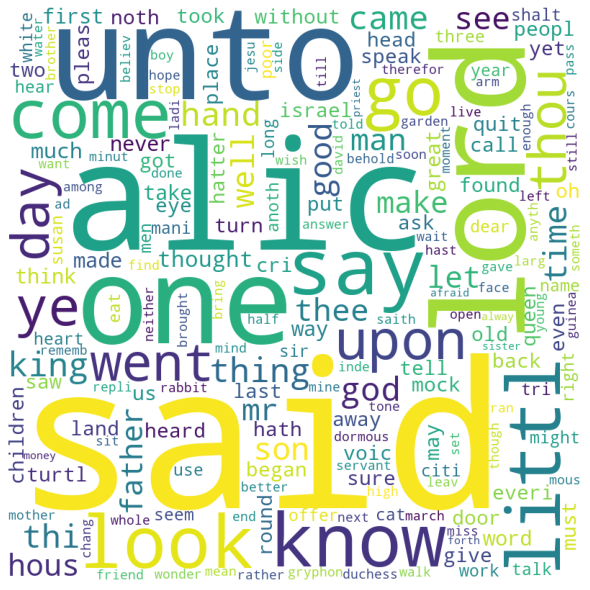

In [ ]:
if kappa_score != 1:
  error_prediction=compined_data[compined_data['cluster_name_tf']!= compined_data['label']]

  error_text = error_prediction['Text_sample']
  worldcloud(error_text)
else:
  print('We can not plot word cloud for wordes here becuse no error her, Kappa score = 1.0') 

## GaussianMixture with Tf-Idf silhouette_score

In [ ]:
from sklearn.metrics import silhouette_score

silhouette_score=silhouette_score(X_tf,labels_tf)
print(silhouette_score)

0.044822658598994196


## GaussianMixture with Tf-Idf coherence score

In [ ]:
cm_em = CoherenceModel(model =gmm_tf, topics=topics, 
                    texts=texts,
                    coherence='c_v',  
                    dictionary=word2id)

coherence_em = cm_em.get_coherence()  # get coherence value
print(coherence_em)

0.620658216925428


In [ ]:
overall['GaussianMixture_tf']['Kappa_Score']=kappa_score
overall['GaussianMixture_tf']['silhouette_score']=silhouette_score
overall['GaussianMixture_tf']['coherence_score']=coherence_em

# Apply tf idf with bigram

In [ ]:
tf = TfidfVectorizer(ngram_range=(2,2))
X_tf_bi=tf.fit_transform(X).toarray()

In [ ]:
pd.DataFrame(X_tf_bi,columns=tf.get_feature_names())

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,aaron beaten,aaron begat,aaron behav,aaron david,aaron day,aaron forth,aaron gad,aaron given,aaron great,aaron hand,...,zoar eliakim,zobah made,zobebah israel,zone parent,zone upon,zone young,zophah god,zophim shout,zuph bread,zur jerusalem
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


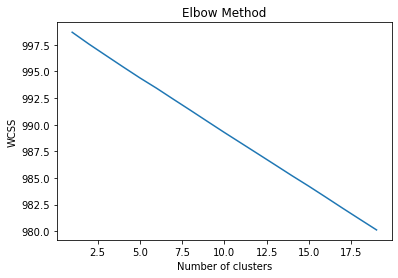

In [ ]:
wcss = []
for i in range(1, 20):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=0)
    kmeans.fit(X_tf_bi)
    wcss.append(kmeans.inertia_)
plt.plot(range(1, 20), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

## k-means with TF-IDF bigram

In [ ]:
kmeans_tf_bi = KMeans(n_clusters=5, init='k-means++',random_state=0)
pred_y_tf_bi = kmeans_tf_bi.fit_predict(X_tf)

## Clusters Visualization for k-means with TF-IDF bigram

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.093s...
[t-SNE] Computed neighbors for 1000 samples in 2.183s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 0.063294
[t-SNE] KL divergence after 250 iterations with early exaggeration: 72.506386
[t-SNE] KL divergence after 1000 iterations: 2.560723


[Text(0.5, 1.0, 'kmeans TF-BI T-SNE projection')]

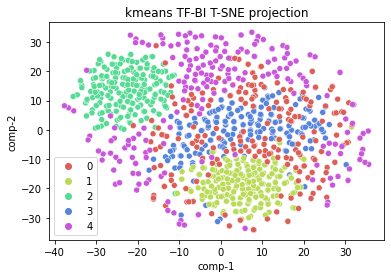

In [ ]:
# Clusters Visualization
tsne = TSNE(n_components=2, verbose=1, random_state=42)
z = tsne.fit_transform(X_tf_bi)

tsne_df = pd.DataFrame()
tsne_df["y"] = pred_y_tf_bi
tsne_df["comp-1"] = z[:,0]
tsne_df["comp-2"] = z[:,1]

sns.scatterplot(x="comp-1", y="comp-2", hue=tsne_df.y.tolist(),
                palette=sns.color_palette("hls", 5),
                data=tsne_df).set(title="kmeans TF-BI T-SNE projection") 

In [ ]:
pd.Series(pred_y_tf_bi).value_counts()

3    200
2    200
1    200
0    200
4    200
dtype: int64

In [ ]:
kmean_results_tf_bi = pd.DataFrame(pred_y_tf_bi, columns=['Cluster'])

kmean_results_tf_bi

,Cluster
0,3
1,3
2,3
3,3
4,3
...,...
995,4
996,4
997,4
998,4


In [ ]:
compined_data = pd.concat([kmean_results_tf_bi, df_final],axis = 1)

compined_data

,Cluster,Text_sample_,label,Text_sample
0,3,"[happen, shock, discreetli, jane, unworthi, se...",1,happen shock discreetli jane unworthi send son...
1,3,"[nice, societi, could, question, bye, determin...",1,nice societi could question bye determin wheth...
2,3,"[flirtat, temper, without, someth, side, last,...",1,flirtat temper without someth side last nobodi...
3,3,"[servic, prevent, forgot, give, utter, name, m...",1,servic prevent forgot give utter name mr talk ...
4,3,"[health, repeat, isabella, hesit, sigh, snow, ...",1,health repeat isabella hesit sigh snow held wo...
...,...,...,...,...
995,4,"[year, pathway, pain, dear, rick, pass, futur,...",5,year pathway pain dear rick pass futur larg ge...
996,4,"[forc, shot, build, veda, sail, well, day, sha...",5,forc shot build veda sail well day shark word ...
997,4,"[like, soldier, much, continu, see, shallow, d...",5,like soldier much continu see shallow dropt re...
998,4,"[thunder, spirit, good, command, passion, mani...",5,thunder spirit good command passion mani festi...


In [ ]:
zero_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 0]['label']))[0][0]
one_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 1]['label']))[0][0]
two_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 2]['label']))[0][0]
three_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 3]['label']))[0][0]
four_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 4]['label']))[0][0]

/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:498: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  counts = np.zeros(a_view.shape[:-1], dtype=np.int)
/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:498: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the r

In [ ]:
compined_data['cluster_name_tf_bi'] = compined_data['Cluster'].map({0:zero_map_val, 
                                                                    1:one_map_val,
                                                                    2:two_map_val,
                                                                    3:three_map_val, 
                                                                    4:four_map_val})

compined_data

,Cluster,Text_sample_,label,Text_sample,cluster_name_tf_bi
0,3,"[happen, shock, discreetli, jane, unworthi, se...",1,happen shock discreetli jane unworthi send son...,1
1,3,"[nice, societi, could, question, bye, determin...",1,nice societi could question bye determin wheth...,1
2,3,"[flirtat, temper, without, someth, side, last,...",1,flirtat temper without someth side last nobodi...,1
3,3,"[servic, prevent, forgot, give, utter, name, m...",1,servic prevent forgot give utter name mr talk ...,1
4,3,"[health, repeat, isabella, hesit, sigh, snow, ...",1,health repeat isabella hesit sigh snow held wo...,1
...,...,...,...,...,...
995,4,"[year, pathway, pain, dear, rick, pass, futur,...",5,year pathway pain dear rick pass futur larg ge...,5
996,4,"[forc, shot, build, veda, sail, well, day, sha...",5,forc shot build veda sail well day shark word ...,5
997,4,"[like, soldier, much, continu, see, shallow, d...",5,like soldier much continu see shallow dropt re...,5
998,4,"[thunder, spirit, good, command, passion, mani...",5,thunder spirit good command passion mani festi...,5


## k-means with TF-IDF bigram Kappa Score

In [ ]:
from sklearn.metrics import cohen_kappa_score
kappa_score = cohen_kappa_score(compined_data['cluster_name_tf_bi'],compined_data['label'])
kappa_score 

1.0

## error analysis for k-means with TF-IDF bigram draw word cloud for mistaks words 

In [ ]:
if kappa_score != 1:
  error_prediction=compined_data[compined_data['cluster_name']!= compined_data['label']]

  error_text = error_prediction['Text_sample']
  worldcloud(error_text)
else:
  print('We can not plot word cloud for wordes here becuse no error her, Kappa score = 1.0')  

We can not plot word cloud for wordes here becuse no error her, Kappa score = 1.0


## k-means with TF-IDF bigram silhouette_score

In [ ]:
from sklearn.metrics import silhouette_score

print(silhouette_score(X_tf_bi,pred_y_tf_bi))

0.0003358388277452551


## k-means with TF-IDF bigram coherence score

In [ ]:
cm = CoherenceModel(model = kmeans_tf_bi, topics=topics, 
                    texts=texts,
                    coherence='c_v',  
                    dictionary=word2id)

coherence = cm.get_coherence() 
print(coherence)

0.620658216925428


{'color_list': ['b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',
  'b',

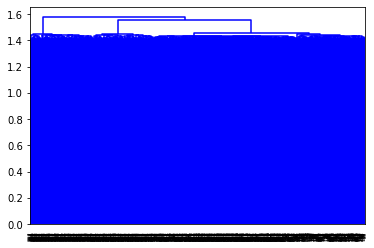

In [ ]:
dendrogram_tf_bi = sch.dendrogram(sch.linkage(X_tf_bi, method='ward'))
dendrogram_tf_bi

In [ ]:
overall['kmeans_tf_bi']['Kappa_Score']=kappa_score
overall['kmeans_tf_bi']['silhouette_score']=silhouette_score(X_tf_bi,pred_y_tf_bi)
overall['kmeans_tf_bi']['coherence_score']=coherence

## AgglomerativeClustering with TF_IDF bigram

In [ ]:
hc_tf_bi = AgglomerativeClustering(n_clusters=5, affinity = 'euclidean', linkage = 'ward')
y_hc_tf_bi = hc_tf_bi.fit_predict(X_tf)

## Clusters Visualization for AgglomerativeClustering with TF_IDF bigram

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.091s...
[t-SNE] Computed neighbors for 1000 samples in 2.230s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 0.063294
[t-SNE] KL divergence after 250 iterations with early exaggeration: 72.506386
[t-SNE] KL divergence after 1000 iterations: 2.560723


[Text(0.5, 1.0, 'Agglomerative TF-BI T-SNE projection')]

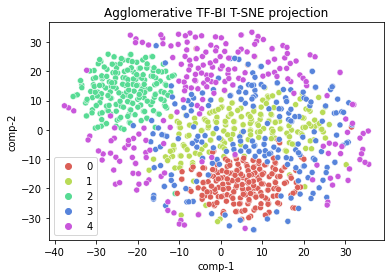

In [ ]:
# Clusters Visualization
tsne = TSNE(n_components=2, verbose=1, random_state=42)
z = tsne.fit_transform(X_tf_bi)

tsne_df = pd.DataFrame()
tsne_df["y"] = y_hc_tf_bi
tsne_df["comp-1"] = z[:,0]
tsne_df["comp-2"] = z[:,1]

sns.scatterplot(x="comp-1", y="comp-2", hue=tsne_df.y.tolist(),
                palette=sns.color_palette("hls", 5),
                data=tsne_df).set(title="Agglomerative TF-BI T-SNE projection") 

In [ ]:
agg_cluster_tf_bi_results = pd.DataFrame(y_hc_tf_bi, columns=['Cluster'])

agg_cluster_tf_bi_results

,Cluster
0,1
1,1
2,1
3,1
4,1
...,...
995,4
996,4
997,4
998,4


In [ ]:
compined_data = pd.concat([agg_cluster_tf_bi_results, df_final],axis = 1)

compined_data

,Cluster,Text_sample_,label,Text_sample
0,1,"[happen, shock, discreetli, jane, unworthi, se...",1,happen shock discreetli jane unworthi send son...
1,1,"[nice, societi, could, question, bye, determin...",1,nice societi could question bye determin wheth...
2,1,"[flirtat, temper, without, someth, side, last,...",1,flirtat temper without someth side last nobodi...
3,1,"[servic, prevent, forgot, give, utter, name, m...",1,servic prevent forgot give utter name mr talk ...
4,1,"[health, repeat, isabella, hesit, sigh, snow, ...",1,health repeat isabella hesit sigh snow held wo...
...,...,...,...,...
995,4,"[year, pathway, pain, dear, rick, pass, futur,...",5,year pathway pain dear rick pass futur larg ge...
996,4,"[forc, shot, build, veda, sail, well, day, sha...",5,forc shot build veda sail well day shark word ...
997,4,"[like, soldier, much, continu, see, shallow, d...",5,like soldier much continu see shallow dropt re...
998,4,"[thunder, spirit, good, command, passion, mani...",5,thunder spirit good command passion mani festi...


In [ ]:
zero_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 0]['label']))[0][0]
one_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 1]['label']))[0][0]
two_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 2]['label']))[0][0]
three_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 3]['label']))[0][0]
four_map_val = stats.mode(np.array(compined_data[compined_data['Cluster'] == 4]['label']))[0][0]

/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:498: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  counts = np.zeros(a_view.shape[:-1], dtype=np.int)
/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:498: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the r

In [ ]:
compined_data['agg_cluster_tf_bi_name'] = compined_data['Cluster'].map({0:zero_map_val, 
                                                                        1:one_map_val,
                                                                        2:two_map_val,
                                                                        3:three_map_val, 
                                                                        4:four_map_val}
                                                                        )

compined_data

,Cluster,Text_sample_,label,Text_sample,agg_cluster_tf_bi_name
0,1,"[happen, shock, discreetli, jane, unworthi, se...",1,happen shock discreetli jane unworthi send son...,1
1,1,"[nice, societi, could, question, bye, determin...",1,nice societi could question bye determin wheth...,1
2,1,"[flirtat, temper, without, someth, side, last,...",1,flirtat temper without someth side last nobodi...,1
3,1,"[servic, prevent, forgot, give, utter, name, m...",1,servic prevent forgot give utter name mr talk ...,1
4,1,"[health, repeat, isabella, hesit, sigh, snow, ...",1,health repeat isabella hesit sigh snow held wo...,1
...,...,...,...,...,...
995,4,"[year, pathway, pain, dear, rick, pass, futur,...",5,year pathway pain dear rick pass futur larg ge...,5
996,4,"[forc, shot, build, veda, sail, well, day, sha...",5,forc shot build veda sail well day shark word ...,5
997,4,"[like, soldier, much, continu, see, shallow, d...",5,like soldier much continu see shallow dropt re...,5
998,4,"[thunder, spirit, good, command, passion, mani...",5,thunder spirit good command passion mani festi...,5


## AgglomerativeClustering with TF_IDF bigram Kappa Score

In [ ]:
from sklearn.metrics import cohen_kappa_score
kappa_score = cohen_kappa_score(compined_data['agg_cluster_tf_bi_name'],compined_data['label'])
kappa_score

1.0

## error analysis for AgglomerativeClustering with TF_IDF bigram

In [ ]:
if kappa_score != 1:
  error_prediction=compined_data[compined_data['agg_cluster_tf_bi_name']!= compined_data['label']]

  error_text = error_prediction['Text_sample']
  worldcloud(error_text)
else:
  print('We can not plot word cloud for wordes here becuse no error her, Kappa score = 1.0')  

We can not plot word cloud for wordes here becuse no error her, Kappa score = 1.0


##  AgglomerativeClustering with TF_IDF bigram silhouette score

In [ ]:
from sklearn.metrics import silhouette_score

silhouette_score=silhouette_score(X_tf_bi,y_hc_tf_bi)
print(silhouette_score)

0.0003358388277452551


##  AgglomerativeClustering with TF_IDF bigram coherence score

In [ ]:
cm_h = CoherenceModel(model =hc_tf_bi, topics=topics, 
                    texts=texts,
                    coherence='c_v',  
                    dictionary=word2id)

coherence_h = cm_h.get_coherence()  # get coherence value
print(coherence_h)

0.620658216925428


In [ ]:

overall['AgglomerativeClustering_tf_bi']['Kappa_Score']=kappa_score
overall['AgglomerativeClustering_tf_bi']['coherence_score']=coherence_h
overall['AgglomerativeClustering_tf_bi']['silhouette_score']=silhouette_score

In [ ]:
X_tf_bi

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

 # Apply tf idf with bigram with PCA
 ###  tf idf with bigram need high computing power so we use PCA to reduce data dimensions 

In [ ]:
X_tf_bi_pca=PCA(n_components=700)
x=X_tf_bi_pca.fit_transform(X_tf_bi)


/usr/local/lib/python3.7/dist-packages/scipy/linalg/decomp_qr.py:20: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  kwargs['lwork'] = ret[-2][0].real.astype(numpy.int)
/usr/local/lib/python3.7/dist-packages/scipy/linalg/decomp_qr.py:20: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, ch

In [ ]:
gmm_tf_bi = GaussianMixture(n_components=5)
gmm_tf_bi.fit(x)
labels_tf_bi = gmm_tf_bi.predict(x)

## Clusters Visualization for GaussianMixture with Tf-Idf bigram 

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.092s...
[t-SNE] Computed neighbors for 1000 samples in 2.215s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 0.063294
[t-SNE] KL divergence after 250 iterations with early exaggeration: 72.506386
[t-SNE] KL divergence after 1000 iterations: 2.560723


[Text(0.5, 1.0, 'gmm  TF-BI T-SNE projection')]

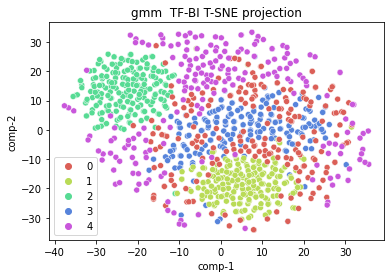

In [ ]:
# Clusters Visualization
tsne = TSNE(n_components=2, verbose=1, random_state=42)
z = tsne.fit_transform(X_tf_bi)

tsne_df = pd.DataFrame()
tsne_df["y"] = pred_y_tf_bi
tsne_df["comp-1"] = z[:,0]
tsne_df["comp-2"] = z[:,1]

sns.scatterplot(x="comp-1", y="comp-2", hue=tsne_df.y.tolist(),
                palette=sns.color_palette("hls", 5),
                data=tsne_df).set(title="gmm  TF-BI T-SNE projection") 

In [ ]:
gmm_results_tf = pd.DataFrame(labels_tf, columns=['Cluster'])

gmm_results_tf

,Cluster
0,1
1,1
2,1
3,1
4,1
...,...
995,4
996,4
997,4
998,4


In [ ]:
compined_data = pd.concat([gmm_results_tf, df_final],axis = 1)

compined_data

,Cluster,Text_sample_,label,Text_sample
0,1,"[happen, shock, discreetli, jane, unworthi, se...",1,happen shock discreetli jane unworthi send son...
1,1,"[nice, societi, could, question, bye, determin...",1,nice societi could question bye determin wheth...
2,1,"[flirtat, temper, without, someth, side, last,...",1,flirtat temper without someth side last nobodi...
3,1,"[servic, prevent, forgot, give, utter, name, m...",1,servic prevent forgot give utter name mr talk ...
4,1,"[health, repeat, isabella, hesit, sigh, snow, ...",1,health repeat isabella hesit sigh snow held wo...
...,...,...,...,...
995,4,"[year, pathway, pain, dear, rick, pass, futur,...",5,year pathway pain dear rick pass futur larg ge...
996,4,"[forc, shot, build, veda, sail, well, day, sha...",5,forc shot build veda sail well day shark word ...
997,4,"[like, soldier, much, continu, see, shallow, d...",5,like soldier much continu see shallow dropt re...
998,4,"[thunder, spirit, good, command, passion, mani...",5,thunder spirit good command passion mani festi...


In [ ]:
compined_data['cluster_name_tf'] = compined_data['Cluster'].map({0:zero_map_val, 
                                                                1:one_map_val,
                                                                2:two_map_val,
                                                                3:three_map_val, 
                                                                4:four_map_val})

compined_data

,Cluster,Text_sample_,label,Text_sample,cluster_name_tf
0,1,"[happen, shock, discreetli, jane, unworthi, se...",1,happen shock discreetli jane unworthi send son...,1
1,1,"[nice, societi, could, question, bye, determin...",1,nice societi could question bye determin wheth...,1
2,1,"[flirtat, temper, without, someth, side, last,...",1,flirtat temper without someth side last nobodi...,1
3,1,"[servic, prevent, forgot, give, utter, name, m...",1,servic prevent forgot give utter name mr talk ...,1
4,1,"[health, repeat, isabella, hesit, sigh, snow, ...",1,health repeat isabella hesit sigh snow held wo...,1
...,...,...,...,...,...
995,4,"[year, pathway, pain, dear, rick, pass, futur,...",5,year pathway pain dear rick pass futur larg ge...,5
996,4,"[forc, shot, build, veda, sail, well, day, sha...",5,forc shot build veda sail well day shark word ...,5
997,4,"[like, soldier, much, continu, see, shallow, d...",5,like soldier much continu see shallow dropt re...,5
998,4,"[thunder, spirit, good, command, passion, mani...",5,thunder spirit good command passion mani festi...,5


## GaussianMixture with Tf-Idf bigram  kappa score

In [ ]:
from sklearn.metrics import cohen_kappa_score
kappa_score = cohen_kappa_score(compined_data['cluster_name_tf'],compined_data['label'])
kappa_score 

0.25

## GaussianMixture with Tf-Idf bigram erorr analysis draw word cloud for mistaks words

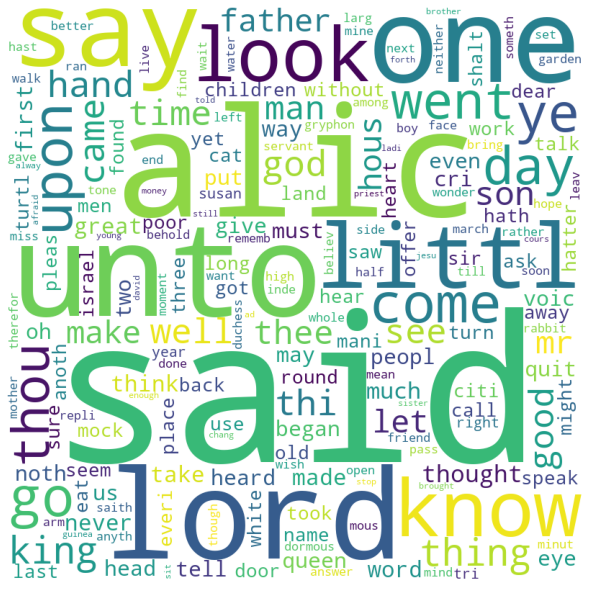

In [ ]:
if kappa_score != 1:
  error_prediction=compined_data[compined_data['cluster_name_tf']!= compined_data['label']]

  error_text = error_prediction['Text_sample']
  worldcloud(error_text)
else:
  print('We can not plot word cloud for wordes here becuse no error her, Kappa score = 1.0')  

## GaussianMixture with Tf-Idf bigram  silhouette score

In [ ]:
from sklearn.metrics import silhouette_score

silhouette_score=silhouette_score(X_tf_bi,labels_tf_bi)
print(silhouette_score)

-5.0121805816042436e-05


## GaussianMixture with Tf-Idf bigram coherence score

In [ ]:
cm_em = CoherenceModel(model =gmm_tf_bi, topics=topics, 
                    texts=texts,
                    coherence='c_v',  
                    dictionary=word2id)

coherence_em = cm_em.get_coherence()  # get coherence value
print(coherence_em)

0.620658216925428


In [ ]:
overall['GaussianMixture_tf_bi']['Kappa_Score']=kappa_score
overall['GaussianMixture_tf_bi']['coherence_score']=coherence_em
overall['GaussianMixture_tf_bi']['silhouette_score']=silhouette_score

In [ ]:
df=pd.DataFrame(overall)
df=df.transpose()

In [ ]:
df

,Kappa_Score,silhouette_score,coherence_score
kmeans_pow,1.00000,0.062691,0.620658
AgglomerativeClustering_pow,0.25000,0.062411,0.620658
GaussianMixture_pow,1.00000,0.062691,0.620658
kmeans_pow_2000,1.00000,0.063068,0.620658
AgglomerativeClustering_pow_2000,0.99625,0.062696,0.620658
GaussianMixture_pow_2000,1.00000,0.063068,0.620658
kmeans_tf,1.00000,0.044823,0.620658
AgglomerativeClustering_tf,1.00000,0.044823,0.620658
GaussianMixture_tf,0.25000,0.044823,0.620658
kmeans_tf_bi,1.00000,0.000336,0.620658


In [ ]:
! pip install pycaret[full]

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 320 kB 3.9 MB/s 
     |████████████████████████████████| 88 kB 9.2 MB/s 
     |████████████████████████████████| 2.0 MB 61.2 MB/s 
     |████████████████████████████████| 262 kB 80.2 MB/s 
     |████████████████████████████████| 10.4 MB 78.0 MB/s 
     |████████████████████████████████| 17.8 MB 77.1 MB/s 
     |████████████████████████████████| 6.8 MB 66.5 MB/s 
     |████████████████████████████████| 56 kB 5.8 MB/s 
     |████████████████████████████████| 167 kB 77.9 MB/s 
     |████████████████████████████████| 1.3 MB 63.6 MB/s 
     |████████████████████████████████| 120 kB 76.2 MB/s 
     |████████████████████████████████| 100 kB 11.7 MB/s 
     |████████████████████████████████| 308 kB 94.0 MB/s 
     |████████████████████████████████| 76.6 MB 1.2 MB/s 
     |████████████████████████████████| 569 kB 68.1 MB/s 
     |████████████████████████████

In [ ]:
! pip uninstall numpy --yes

Found existing installation: numpy 1.19.5
Uninstalling numpy-1.19.5:
  Successfully uninstalled numpy-1.19.5


In [ ]:
! pip install numpy==1.20.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 15.3 MB 3.8 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
yellowbrick 1.3.post1 requires numpy<1.20,>=1.16.0, but you have numpy 1.20.0 which is incompatible.
xarray-einstats 0.2.2 requires numpy>=1.21, but you have numpy 1.20.0 which is incompatible.
google-colab 1.0.0 requires ipykernel~=4.10, but you have ipykernel 6.15.0 which is incompatible.
google-colab 1.0.0 requires ipython~=5.5.0, but you have ipython 7.34.0 which is incompatible.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.28.0 which is incompatible.
google-colab 1.0.0 requires tornado~=5.1.0; python_version >= "3.0", but you have tornado 6.1 which is incompatible.
en-core-web-sm 3.3.0 requires spacy<3.4.0,>=3.3.0.dev0, but you ha

In [ ]:
! pip uninstall Jinja2 --yes

Found existing installation: Jinja2 2.11.3
Uninstalling Jinja2-2.11.3:
  Successfully uninstalled Jinja2-2.11.3


In [ ]:
! pip install Jinja2

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 133 kB 4.1 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires ipykernel~=4.10, but you have ipykernel 6.15.0 which is incompatible.
google-colab 1.0.0 requires ipython~=5.5.0, but you have ipython 7.34.0 which is incompatible.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.28.0 which is incompatible.
google-colab 1.0.0 requires tornado~=5.1.0; python_version >= "3.0", but you have tornado 6.1 which is incompatible.
flask 1.1.4 requires Jinja2<3.0,>=2.10.1, but you have jinja2 3.1.2 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.


# hint
After installation you shoud restart the run time and start to run the next cell

In [ ]:
import pandas as pd
df_final = pd.read_csv('data.csv',index_col = 0)
df_final.head()

,Text_sample_,label,Text_sample
0,['mr' 'cannot' 'none' 'sin' 'boot' 'regret' 's...,austen-emma,mr cannot none sin boot regret said back enjoy...
1,['want' 'matter' 'use' 'moment' 'door' 'dixon'...,austen-emma,want matter use moment door dixon littl marria...
2,['time' 'manner' 'assur' 'shew' 'stupid' 'much...,austen-emma,time manner assur shew stupid much given sorri...
3,['mr' 'would' 'delicaci' 'mistaken' 'belong' '...,austen-emma,mr would delicaci mistaken belong first better...
4,['written' 'hear' 'therefor' 'recur' 'well' 'e...,austen-emma,written hear therefor recur well elton think o...


In [ ]:
from pycaret.utils import enable_colab
enable_colab()

Colab mode enabled.


In [ ]:
from pycaret.nlp import *

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_gb.py:33: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  from ._gradient_boosting import predict_stages
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_gb.py:33: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  from ._gradient_boosting import predict_stages


In [ ]:
df_final.head()

,Text_sample_,label,Text_sample
0,['mr' 'cannot' 'none' 'sin' 'boot' 'regret' 's...,austen-emma,mr cannot none sin boot regret said back enjoy...
1,['want' 'matter' 'use' 'moment' 'door' 'dixon'...,austen-emma,want matter use moment door dixon littl marria...
2,['time' 'manner' 'assur' 'shew' 'stupid' 'much...,austen-emma,time manner assur shew stupid much given sorri...
3,['mr' 'would' 'delicaci' 'mistaken' 'belong' '...,austen-emma,mr would delicaci mistaken belong first better...
4,['written' 'hear' 'therefor' 'recur' 'well' 'e...,austen-emma,written hear therefor recur well elton think o...


In [ ]:
! pip install https://github.com/explosion/spacy-models/releases/download/en_core_web_md-2.0.0/en_core_web_md-2.0.0.tar.gz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 120.8 MB 106 kB/s 


In [ ]:
! python -m spacy download en_core_web_sm
! python -m textblob.download_corpora

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached en_core_web_sm-2.3.1-py3-none-any.whl
✔ Download and installation successful
You can now load the model via spacy.load('en_core_web_sm')
[nltk_data] Downloading package brown to /root/nltk_data...
[nltk_data]   Package brown is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package conll2000 to /root/nltk_data...
[nltk_data]   Package conll2000 is already up-to-date!
[nltk_data] Downloading package movie_reviews to /root/nltk_data...
[nltk_data]   Package movie_reviews i

In [ ]:
lda = setup(data = df_final, target = 'Text_sample', session_id=123) 

Description,Value
session_id,123
Documents,1000
Vocab Size,5619
Custom Stopwords,False


In [ ]:
m1 = create_model(model='lda',num_topics = 5, multi_core=True)

In [ ]:
lda_data = assign_model(m1) 

In [ ]:
lda_data.head()

,Text_sample_,label,Text_sample,Topic_0,Topic_1,Topic_2,Topic_3,Topic_4,Dominant_Topic,Perc_Dominant_Topic
0,['mr' 'cannot' 'none' 'sin' 'boot' 'regret' 's...,austen-emma,none sin boot regret say back enjoy hand inter...,0.002680,0.002718,0.125087,0.866827,0.002687,Topic 3,0.87
1,['want' 'matter' 'use' 'moment' 'door' 'dixon'...,austen-emma,want matter use moment door small bring young ...,0.071220,0.002421,0.002429,0.921507,0.002423,Topic 3,0.92
2,['time' 'manner' 'assur' 'shew' 'stupid' 'much...,austen-emma,much give much appear would return well say pl...,0.002521,0.002462,0.002478,0.990061,0.002477,Topic 3,0.99
3,['mr' 'would' 'delicaci' 'mistaken' 'belong' '...,austen-emma,would delicaci mistaken belong first well loss...,0.002032,0.002035,0.030088,0.963807,0.002039,Topic 3,0.96
4,['written' 'hear' 'therefor' 'recur' 'well' 'e...,austen-emma,write hear think frank woman make delight vain...,0.002671,0.002659,0.041621,0.950389,0.002660,Topic 3,0.95


In [ ]:
lda_data.Dominant_Topic	.value_counts()

Topic 2    451
Topic 3    351
Topic 0    104
Topic 1     53
Topic 4     41
Name: Dominant_Topic, dtype: int64

In [ ]:
plot_model(m1, plot = 'frequency')

In [ ]:
plot_model(m1, plot = 'sentiment')

In [ ]:
evaluate_model(m1)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Frequency Plot', 'freque…

In [ ]:
lda_data_new = lda_data.drop(['Text_sample_','Dominant_Topic','Perc_Dominant_Topic','Text_sample','label'],axis=1)

In [ ]:
lda_data_new

,Topic_0,Topic_1,Topic_2,Topic_3,Topic_4
0,0.002680,0.002718,0.125087,0.866827,0.002687
1,0.071220,0.002421,0.002429,0.921507,0.002423
2,0.002521,0.002462,0.002478,0.990061,0.002477
3,0.002032,0.002035,0.030088,0.963807,0.002039
4,0.002671,0.002659,0.041621,0.950389,0.002660
...,...,...,...,...,...
995,0.228921,0.763306,0.002593,0.002600,0.002581
996,0.002771,0.537872,0.152615,0.002771,0.303971
997,0.989430,0.002600,0.002702,0.002660,0.002608
998,0.500871,0.002378,0.002376,0.002372,0.492003


In [ ]:
from pycaret.clustering import *
setup_c = setup(lda_data_new, session_id = 123)

,Description,Value
0,session_id,123
1,Original Data,"(1000, 5)"
2,Missing Values,False
3,Numeric Features,5
4,Categorical Features,0
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(1000, 5)"
9,CPU Jobs,-1


In [ ]:
kmeans = create_model('kmeans',num_clusters = 5)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.7428,2074.3981,0.4973,0,0,0


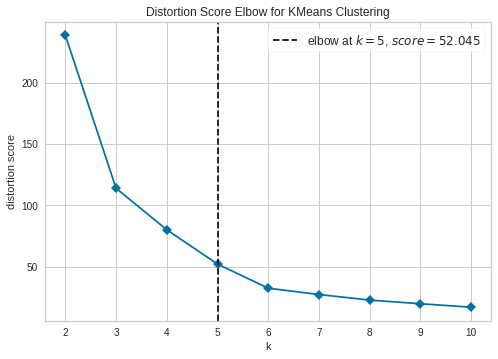

In [ ]:
plot_model(kmeans, plot = 'elbow')

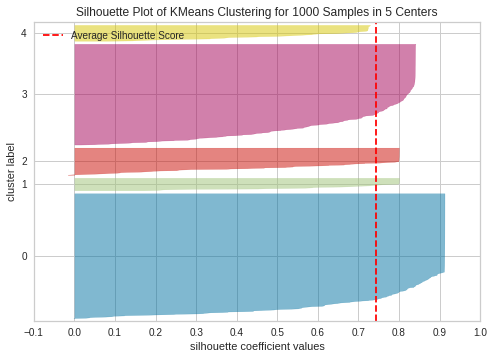

In [ ]:
plot_model(kmeans, plot = 'silhouette')

In [ ]:
hclust = create_model('hclust',num_clusters = 5)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.7392,1964.5923,0.5319,0,0,0


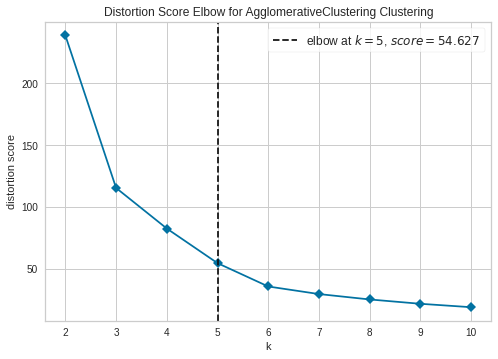

In [ ]:
plot_model(hclust, plot = 'elbow')

In [ ]:
meanshift = create_model('meanshift',num_clusters = 5)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.7427,2073.1338,0.4986,0,0,0


## our champion Model is LDA + Kmean

In [ ]:
kmean_results = assign_model(kmeans)

In [ ]:
kmean_results

,Topic_0,Topic_1,Topic_2,Topic_3,Topic_4,Cluster
0,0.002680,0.002718,0.125087,0.866827,0.002687,Cluster 3
1,0.071220,0.002421,0.002429,0.921507,0.002423,Cluster 3
2,0.002521,0.002462,0.002478,0.990061,0.002477,Cluster 3
3,0.002032,0.002035,0.030088,0.963807,0.002039,Cluster 3
4,0.002671,0.002659,0.041621,0.950389,0.002660,Cluster 3
...,...,...,...,...,...,...
995,0.228921,0.763306,0.002593,0.002600,0.002581,Cluster 4
996,0.002771,0.537872,0.152615,0.002771,0.303971,Cluster 4
997,0.989430,0.002600,0.002702,0.002660,0.002608,Cluster 2
998,0.500871,0.002378,0.002376,0.002372,0.492003,Cluster 1


In [ ]:
kmean_results['Cluster']

0      Cluster 3
1      Cluster 3
2      Cluster 3
3      Cluster 3
4      Cluster 3
         ...    
995    Cluster 4
996    Cluster 4
997    Cluster 2
998    Cluster 1
999    Cluster 1
Name: Cluster, Length: 1000, dtype: object

In [ ]:
compined_data = pd.concat([kmean_results,df_final],axis = 1)

In [ ]:
compined_data

,Topic_0,Topic_1,Topic_2,Topic_3,Topic_4,Cluster,Text_sample_,label,Text_sample
0,0.002680,0.002718,0.125087,0.866827,0.002687,Cluster 3,['mr' 'cannot' 'none' 'sin' 'boot' 'regret' 's...,austen-emma,mr cannot none sin boot regret said back enjoy...
1,0.071220,0.002421,0.002429,0.921507,0.002423,Cluster 3,['want' 'matter' 'use' 'moment' 'door' 'dixon'...,austen-emma,want matter use moment door dixon littl marria...
2,0.002521,0.002462,0.002478,0.990061,0.002477,Cluster 3,['time' 'manner' 'assur' 'shew' 'stupid' 'much...,austen-emma,time manner assur shew stupid much given sorri...
3,0.002032,0.002035,0.030088,0.963807,0.002039,Cluster 3,['mr' 'would' 'delicaci' 'mistaken' 'belong' '...,austen-emma,mr would delicaci mistaken belong first better...
4,0.002671,0.002659,0.041621,0.950389,0.002660,Cluster 3,['written' 'hear' 'therefor' 'recur' 'well' 'e...,austen-emma,written hear therefor recur well elton think o...
...,...,...,...,...,...,...,...,...,...
995,0.228921,0.763306,0.002593,0.002600,0.002581,Cluster 4,['swollen' 'gang' 'time' 'perform' 'pillow' 's...,whitman-leaves,swollen gang time perform pillow ship distil w...
996,0.002771,0.537872,0.152615,0.002771,0.303971,Cluster 4,['matest' 'makest' 'prepar' 'fenc' 'young' 'dr...,whitman-leaves,matest makest prepar fenc young dread ach ray ...
997,0.989430,0.002600,0.002702,0.002660,0.002608,Cluster 2,['imbu' 'bank' 'factori' 'ring' 'mean' 'bloodi...,whitman-leaves,imbu bank factori ring mean bloodiest stop rid...
998,0.500871,0.002378,0.002376,0.002372,0.492003,Cluster 1,['ever' 'past' 'low' 'strike' 'seen' 'ship' 'k...,whitman-leaves,ever past low strike seen ship keep cours chil...


In [ ]:
compined_data['cluster_name'] = compined_data['Cluster'].map({'Cluster 3':'austen-emma','Cluster 2':'bible-kjv',
                                                              'Cluster 0':'carroll-alice','Cluster 1':'edgeworth-parents',
                                                              'Cluster 4':'whitman-leaves'})

## Kappa Score

In [ ]:
from sklearn.metrics import cohen_kappa_score
cohen_kappa_score(compined_data['cluster_name'],compined_data['label'])

0.32125000000000004

## error analysis

In [ ]:
error_prediction=compined_data[compined_data['cluster_name']!= compined_data['label']]

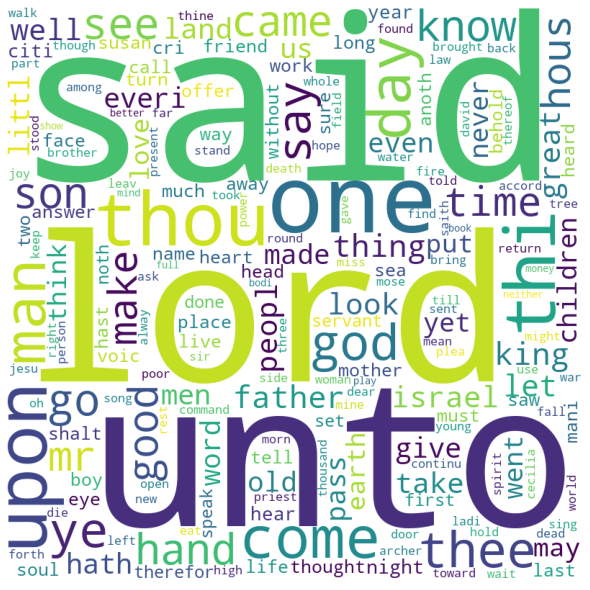

In [ ]:

error_text = error_prediction['Text_sample']
worldcloud(error_text)